In [161]:
import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np
import pandas as pd
import anndata as ad

import matplotlib.pyplot as plt

scv.set_figure_params()

In [173]:
adata = scv.datasets.pancreas()

In [4]:
adata

AnnData object with n_obs × n_vars = 3696 × 27998
    obs: 'clusters_coarse', 'clusters', 'S_score', 'G2M_score'
    var: 'highly_variable_genes'
    uns: 'clusters_coarse_colors', 'clusters_colors', 'day_colors', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap'
    layers: 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

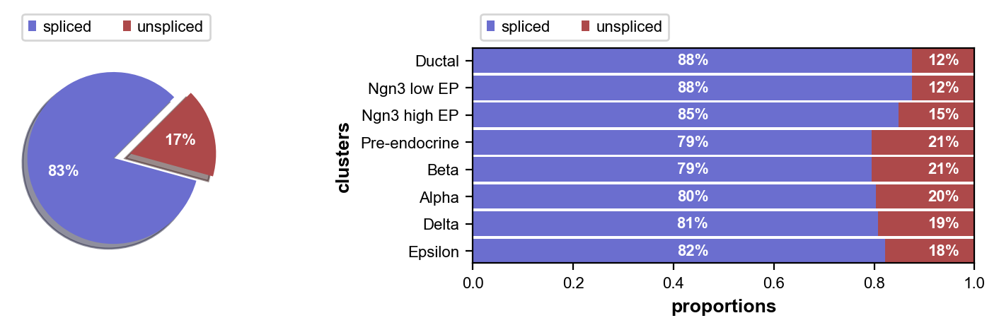

In [16]:
scv.pl.proportions(adata)

## Smaller data after filtering

In [5]:
scv.pp.filter_and_normalize(adata, n_top_genes=1000)
scv.pp.moments(adata)

Normalized count data: X, spliced, unspliced.
Extracted 1000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:07) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


# stochastic modeling

In [6]:
scv.tl.velocity(adata, mode='stochastic')

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [7]:
# cell transition graph
scv.tl.velocity_graph(adata)

computing velocity graph (using 1/12 cores)
or disable the progress bar using `show_progress_bar=False`.


c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scvelo\core\_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:00:07) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


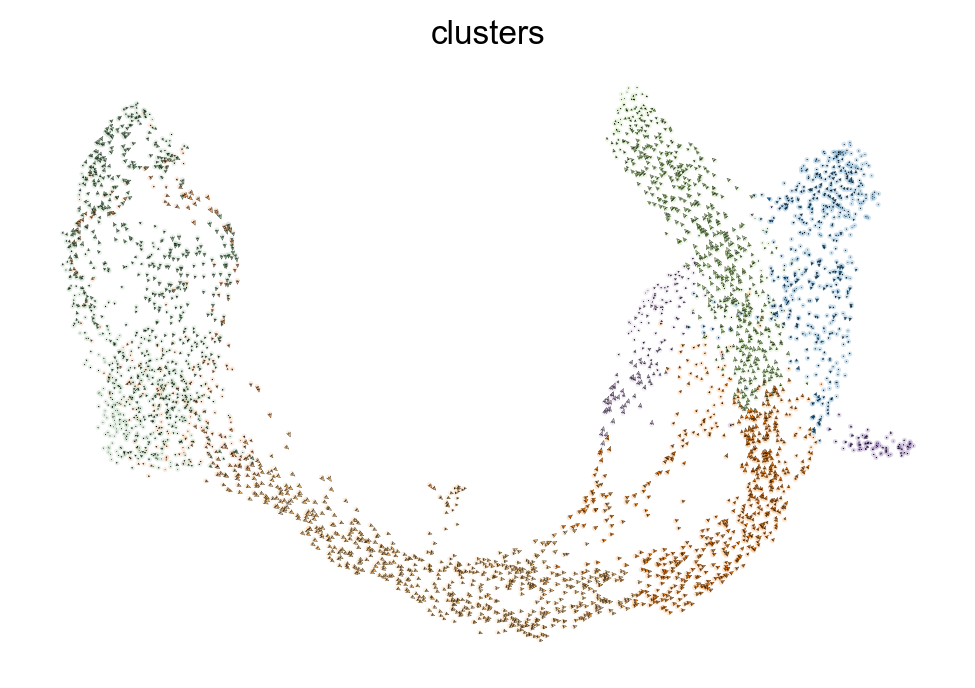

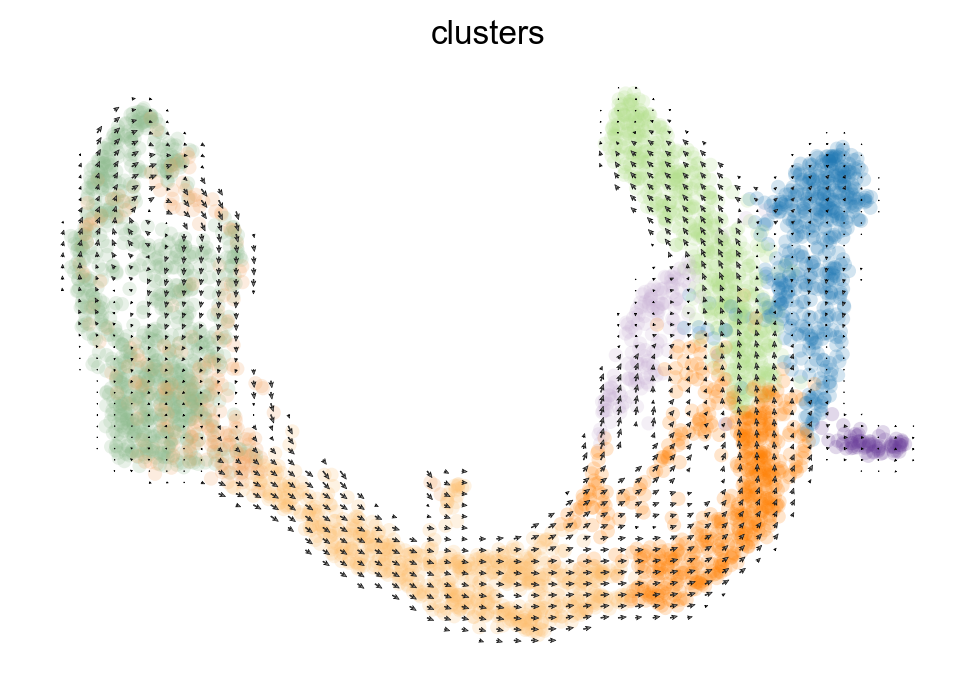

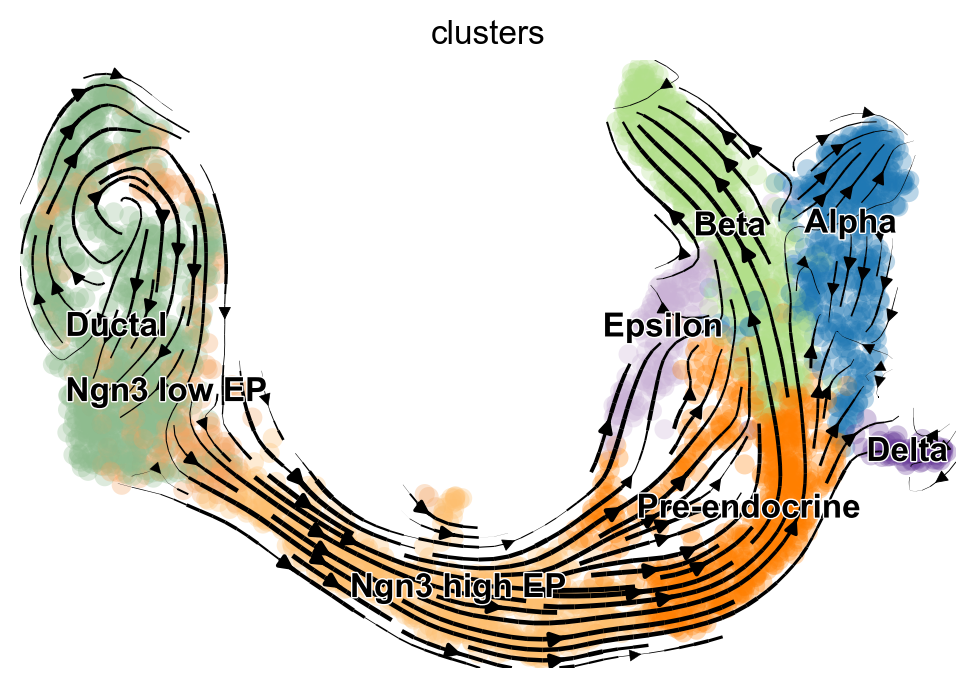

In [8]:
scv.pl.velocity_embedding(adata, basis='umap')
scv.pl.velocity_embedding_grid(adata, basis='umap')
scv.pl.velocity_embedding_stream(adata, basis='umap')

c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scvelo\plotting\scatter.py:614: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scvelo\plotting\scatter.py:614: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()
c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scv

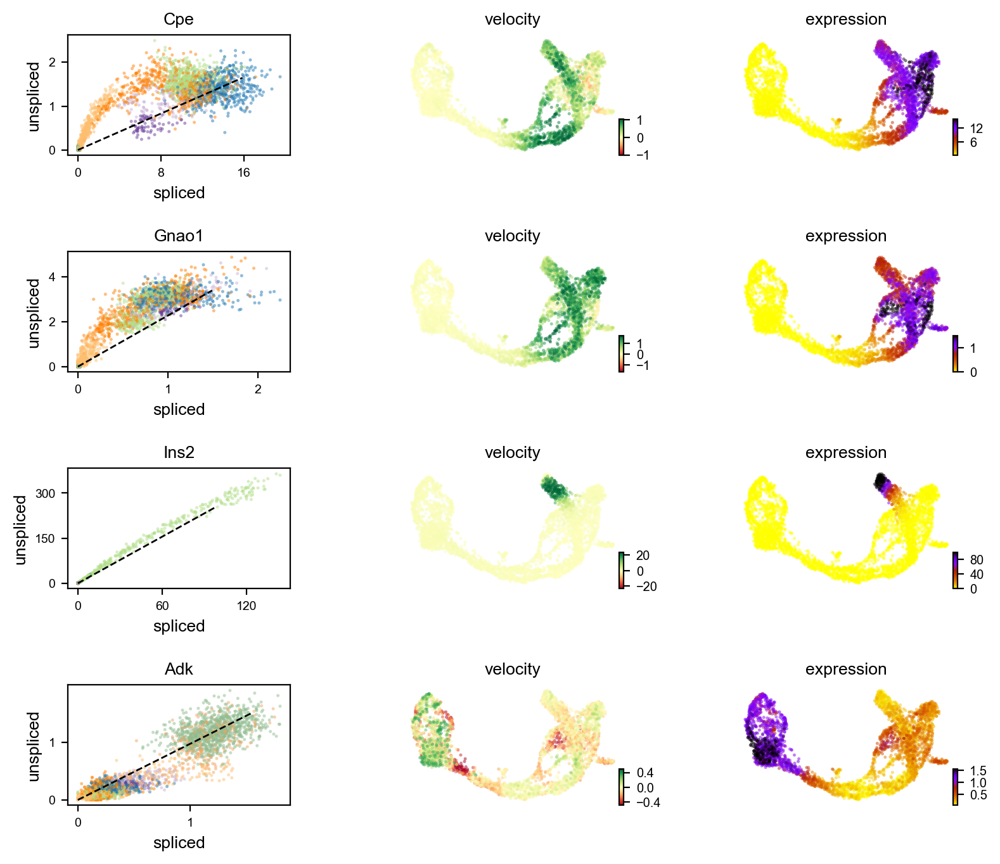

In [17]:
scv.pl.velocity(adata, ['Cpe',  'Gnao1', 'Ins2', 'Adk'], ncols=1)

c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scvelo\plotting\utils.py:1269: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax.scatter(x, y, s=bg_size, marker=".", c=bg_color, zorder=zord - 2, **kwargs)
c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scvelo\plotting\utils.py:1270: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax.scatter(x, y, s=gp_size, marker=".", c=gp_color, zorder=zord - 1, **kwargs)
c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


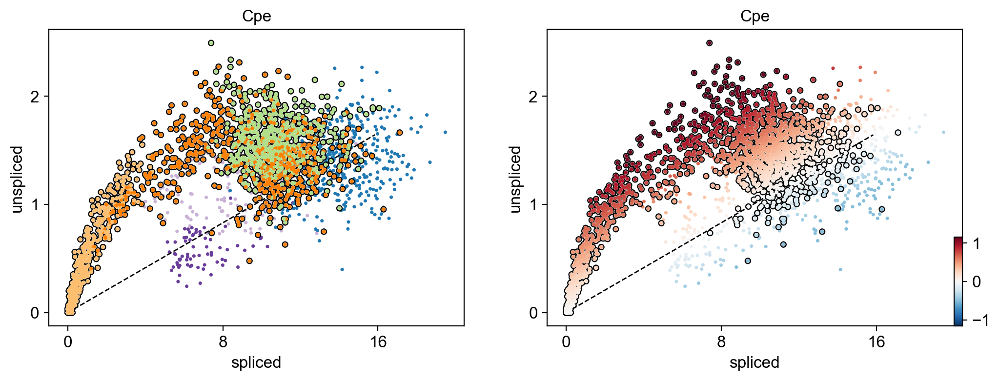

In [9]:
scv.pl.scatter(adata, 'Cpe', color=['clusters', 'velocity'],
               add_outline='Ngn3 high EP, Pre-endocrine, Beta')

## Identify important genes

In [10]:
scv.tl.rank_velocity_genes(adata, groupby='clusters', min_corr=.3)

df = scv.DataFrame(adata.uns['rank_velocity_genes']['names'])
df.head()

ranking velocity genes


c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scvelo\tools\utils.py:501: DeprecationWarning: Please use `rankdata` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from scipy.stats.stats import rankdata


    finished (0:00:01) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


C:\Users\Owner\AppData\Local\Temp\ipykernel_13272\1614465797.py:3: DeprecationWarning: `scvelo.read_load.get_df` is deprecated since scVelo v0.2.4 and will be removed in a future version. Please use `scvelo.core.get_df` instead.
  df = scv.DataFrame(adata.uns['rank_velocity_genes']['names'])


,Ductal,Ngn3 low EP,Ngn3 high EP,Pre-endocrine,Beta,Alpha,Delta,Epsilon
0,Notch2,Trp53cor1,Ttyh2,Pam,Pax6,Prune2,Zdbf2,Rtn1
1,Krt19,Gm8113,Kcnb2,Abcc8,Nnat,Pdzrn4,Akr1c19,Sphkap
2,Anxa3,Notch2,Map3k15,Gnas,Scg3,Pax6,Spock3,A1cf
3,Atf3,Smoc2,Rbfox3,Sez6l,Kcnmb2,Pak3,Map1b,Gng4
4,Cdk6,Amotl2,Cacna2d1,Pcsk2,Pim2,Kctd8,Ntf3,Trp53cor1


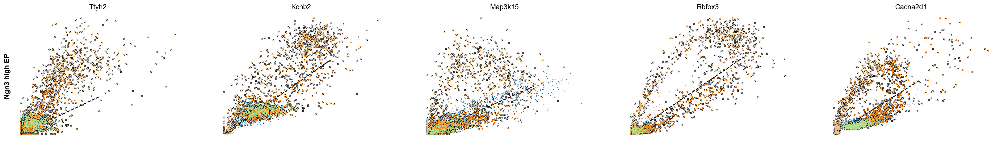

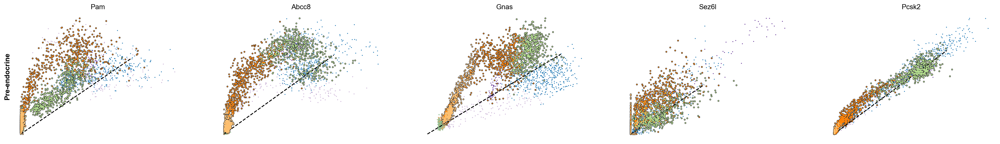

In [11]:
kwargs = dict(frameon=False, size=10, linewidth=1.5,
              add_outline='Ngn3 high EP, Pre-endocrine, Beta')

scv.pl.scatter(adata, df['Ngn3 high EP'][:5], ylabel='Ngn3 high EP', **kwargs)
scv.pl.scatter(adata, df['Pre-endocrine'][:5], ylabel='Pre-endocrine', **kwargs)

## cell cycle scores

calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


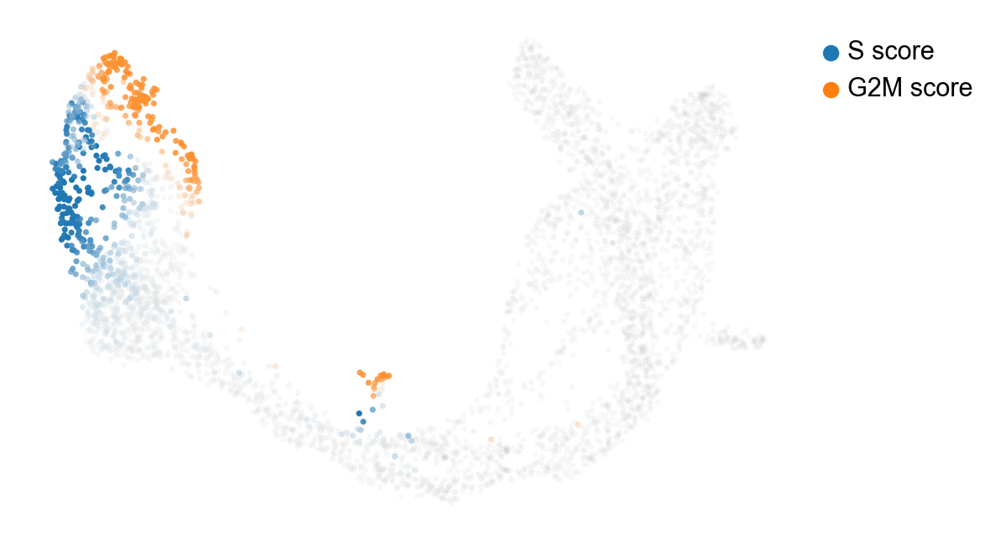

In [174]:
scv.tl.score_genes_cell_cycle(adata)
scv.pl.scatter(adata, color_gradients=['S_score', 'G2M_score'], smooth=True, perc=[5, 95])

c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scvelo\core\_anndata.py:306: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  df.var_names = df.index
c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scvelo\core\_anndata.py:306: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  df.var_names = df.index


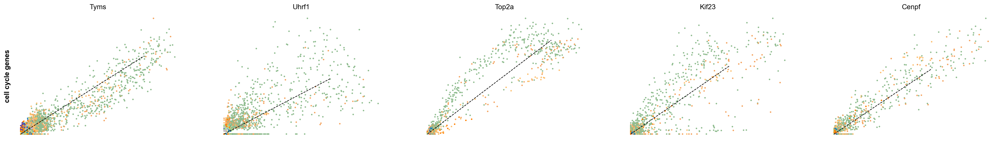

In [13]:
s_genes, g2m_genes = scv.utils.get_phase_marker_genes(adata)
s_genes = scv.get_df(adata[:, s_genes], 'spearmans_score', sort_values=True).index
g2m_genes = scv.get_df(adata[:, g2m_genes], 'spearmans_score', sort_values=True).index

kwargs = dict(frameon=False, ylabel='cell cycle genes')
scv.pl.scatter(adata, list(s_genes[:2]) + list(g2m_genes[:3]), **kwargs)

c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scvelo\plotting\scatter.py:614: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(
c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scvelo\plotting\utils.py:1269: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=bg_size, marker=".", c=bg_color, zorder=zord - 2, **kwargs)
c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scvelo\plotting\utils.py:1270: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(x, y, s=gp_size, marker=".", c=gp_color, zorder=zord - 1, **kwargs)
c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scvelo\plotting\utils.py:1269: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'vmin', 'vmax' will be ignored
  ax.scatter(x, y, s=bg_size, marker=".", c=bg_color, zorder=zord - 2, **kwargs)
c:\ProgramData\A

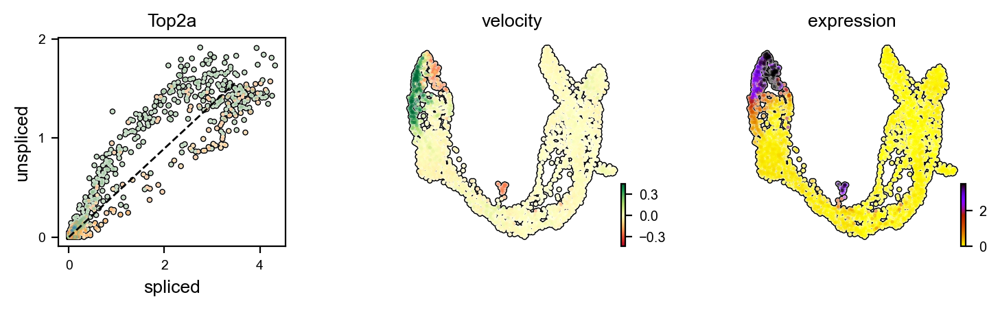

In [15]:
scv.pl.velocity(adata, ['Hells', 'Top2a'], ncols=2, add_outline=True)

## rate of differentiation and coherence of the vector field

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


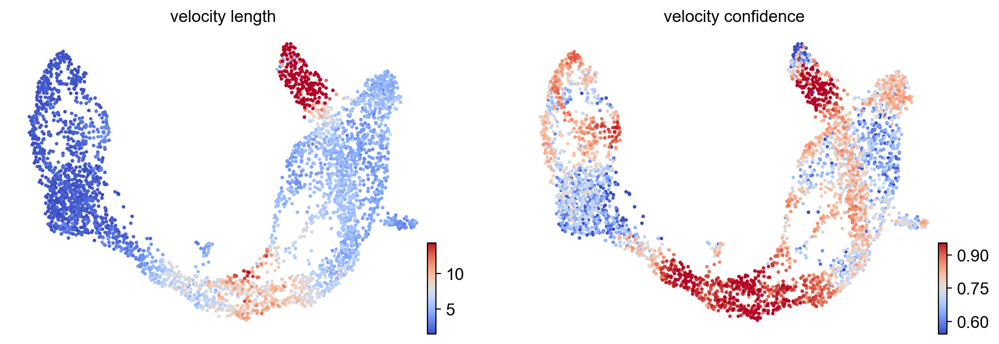

In [16]:
scv.tl.velocity_confidence(adata)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata, c=keys, cmap='coolwarm', perc=[5, 95])

In [17]:
df = adata.obs.groupby('clusters')[keys].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)

clusters,Ductal,Ngn3 low EP,Ngn3 high EP,Pre-endocrine,Beta,Alpha,Delta,Epsilon
velocity_length,1.881223,1.954122,7.065078,5.952720,11.270186,4.493306,3.845428,4.587112
velocity_confidence,0.718377,0.643666,0.898984,0.781688,0.768002,0.699922,0.719661,0.759078


## Velocity graph and pseudotime

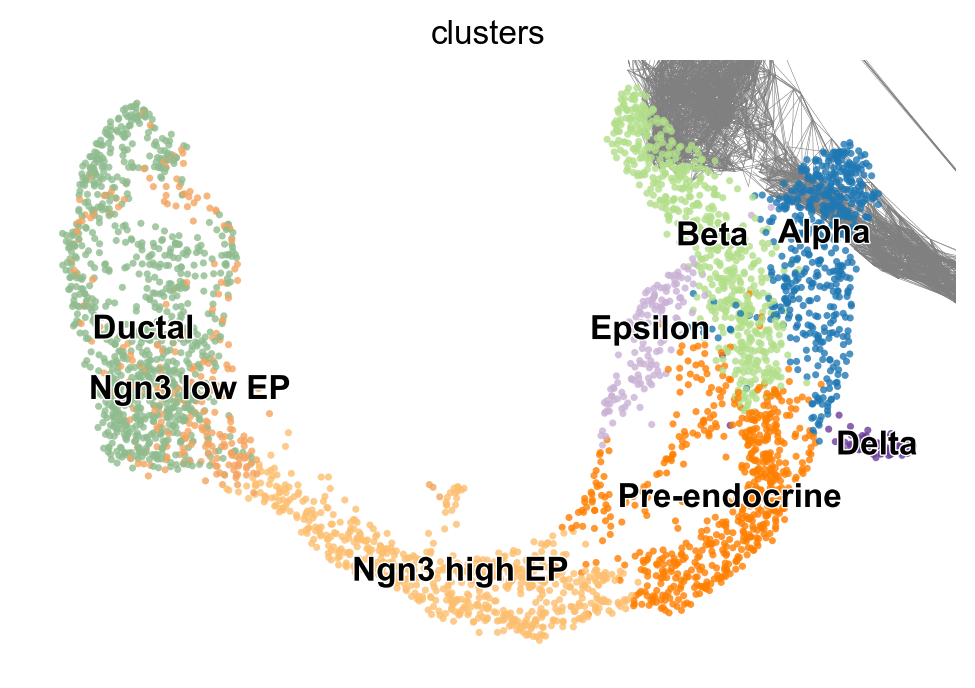

In [19]:
scv.pl.velocity_graph(adata, threshold=.1)

c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


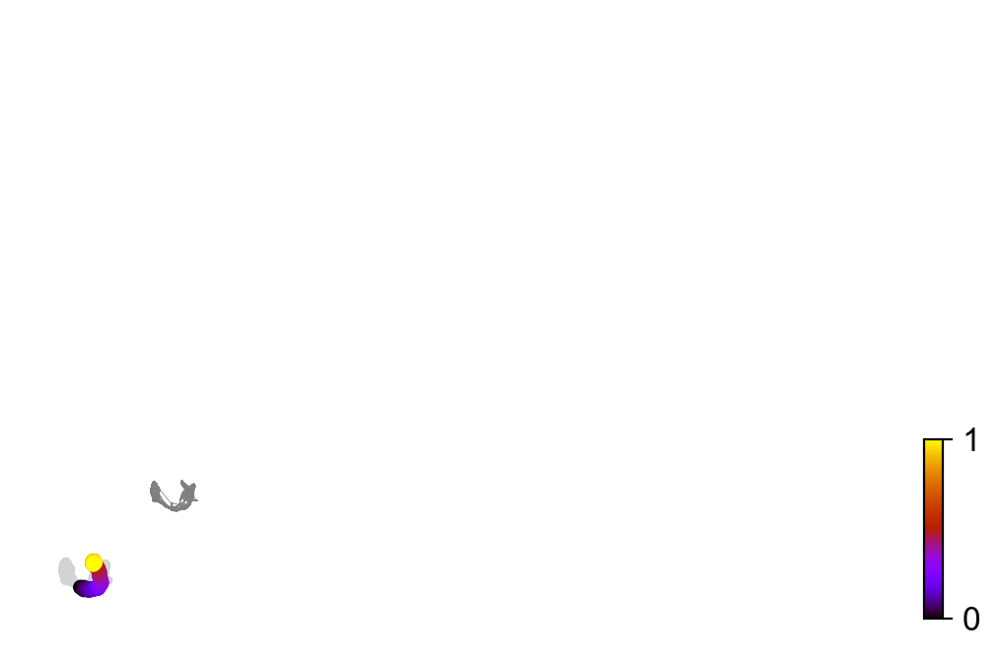

In [20]:
x, y = scv.utils.get_cell_transitions(adata, basis='umap', starting_cell=70)
ax = scv.pl.velocity_graph(adata, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

## PAGA velocity graph

In [21]:
adata.uns['neighbors']['distances'] = adata.obsp['distances']
adata.uns['neighbors']['connectivities'] = adata.obsp['connectivities']

scv.tl.paga(adata, groups='clusters')
df = scv.get_df(adata, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

computing terminal states
    identified 2 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:01) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,Ductal,Ngn3 low EP,Ngn3 high EP,Pre-endocrine,Beta,Alpha,Delta,Epsilon
Ductal,0,0.12,0,0,0,0,0,0
Ngn3 low EP,0,0,0.2,0,0,0,0,0
Ngn3 high EP,0,0,0,0.25,0,0,0,0
Pre-endocrine,0,0,0,0,0.61,0,0,0
Beta,0,0,0,0,0,0,0,0
Alpha,0,0,0,0,0.28,0,0,0
Delta,0,0,0,0,0.096,0,0,0
Epsilon,0,0,0,0,0,0.35,0,0


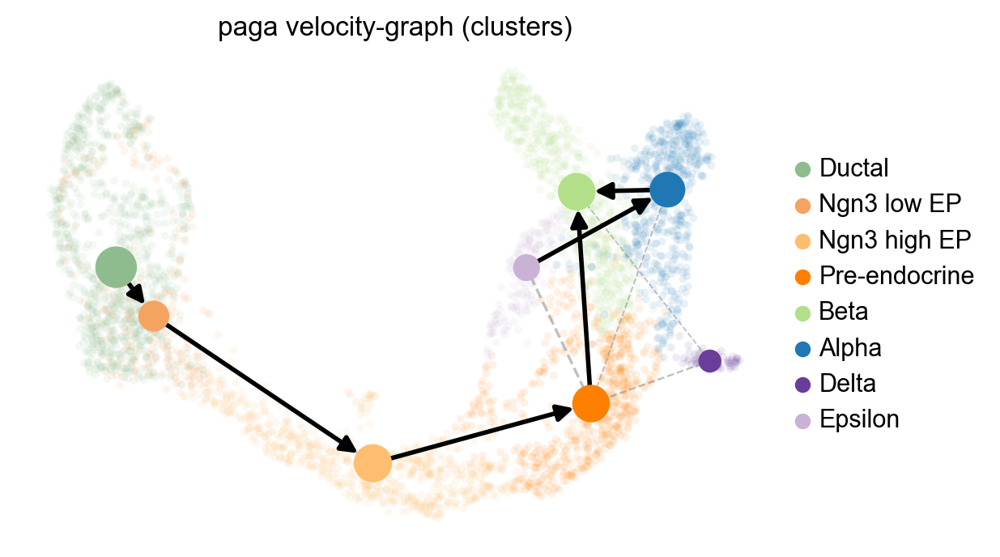

In [22]:
scv.pl.paga(adata, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5)

# Dynamical Model

In [373]:
scv.tl.recover_dynamics(adata, n_jobs =6)

recovering dynamics (using 6/12 cores)
or disable the progress bar using `show_progress_bar=False`.
    finished (0:07:16) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scvelo\tools\dynamical_model.py:721: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scvelo\tools\dynamical_model.py:724: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


In [374]:
scv.tl.velocity(adata, mode='dynamical')
scv.tl.velocity_graph(adata)

computing velocities
    finished (0:00:13) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/12 cores)
    finished (0:00:42) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scvelo\core\_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


## Saving results

In [ ]:
# adata.write('data/pancreas1000.h5ad', compression='gzip')
# adata = scv.read('data/pancreas1000.h5ad')


In [205]:
adata = scv.read('data/pancreas.h5ad')
adata

AnnData object with n_obs × n_vars = 3696 × 27998
    obs: 'clusters_coarse', 'clusters', 'S_score', 'G2M_score', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'highly_variable_genes', 'gene_count_corr', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes', 'spearmans_score', 'velocity_score', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'fit_r2'
    uns: 'clusters_coarse_colors', 'clusters_colors', 'day_colors', 'neighbors', 'pca', 'rank_velocity_genes', 'recover_dynamics', 'velocity_graph', 'velocity_graph_neg', 'velocity_params'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'loss'
    layers: 'Ms', 'Mu', 'fit_t', 'fit_tau', 'fit_tau_', 'spliced', 'unspliced', 'variance_velocity', 'velocity', 'velocity_u'
    obsp: 'c

## Kinetic rate paramters

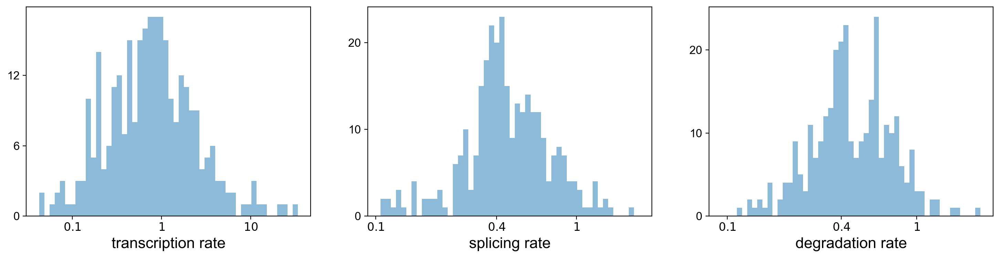

c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scvelo\core\_anndata.py:306: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  df.var_names = df.index


,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,fit_r2
index,,,,,,,,,,,,,,,,
Mcm3,2.10,31.72,0.67,4.34,0.01,0.02,0.66,0.18,0.0,0.0,0.48,0.05,1.93,0.48,1.27,0.30
Fhl2,0.21,0.32,0.12,20.05,0.90,0.21,0.32,0.28,0.0,0.0,0.48,0.56,1.08,0.64,4.97,0.34
Akr1cl,0.60,2.54,0.64,4.02,0.17,0.07,0.20,0.22,0.0,0.0,0.31,0.21,0.60,0.95,1.05,0.66
Mreg,0.21,1.83,0.42,6.59,0.30,0.03,0.13,0.19,0.0,0.0,0.37,0.10,0.40,1.01,1.93,0.48
Igfbp5,0.39,3.89,0.32,5.16,0.22,0.04,0.19,0.19,0.0,0.0,0.43,0.10,0.62,1.15,1.40,0.36


In [27]:
df = adata.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata, 'fit*', dropna=True).head()

## Latent time

computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scvelo\plotting\utils.py:869: MatplotlibDeprecationWarning: The draw_all function was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use fig.draw_without_rendering() instead.
  cb.draw_all()


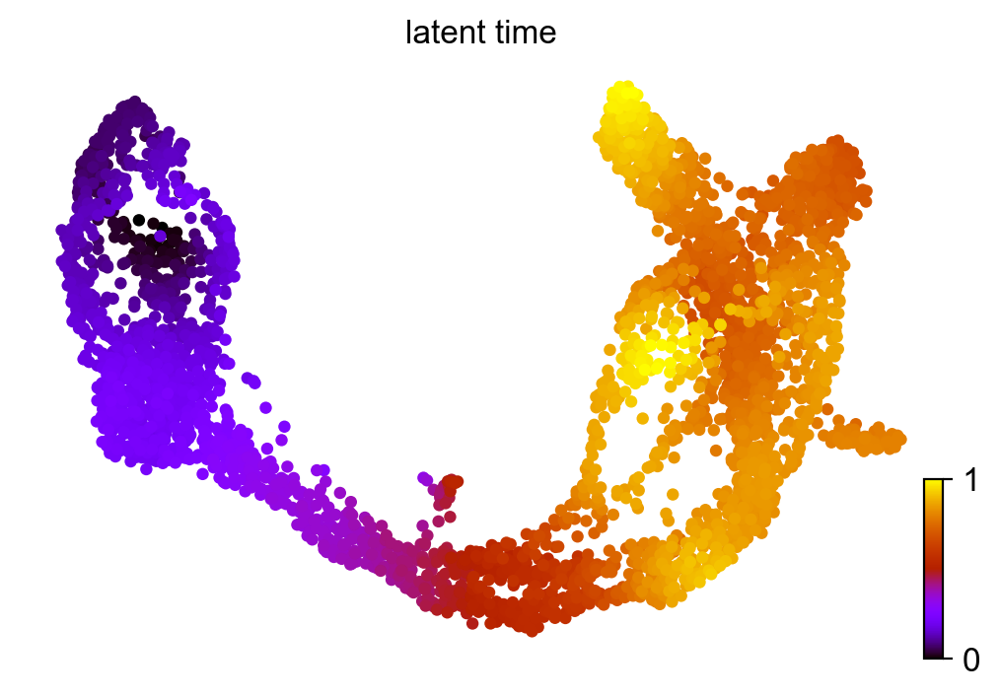

In [28]:
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80)

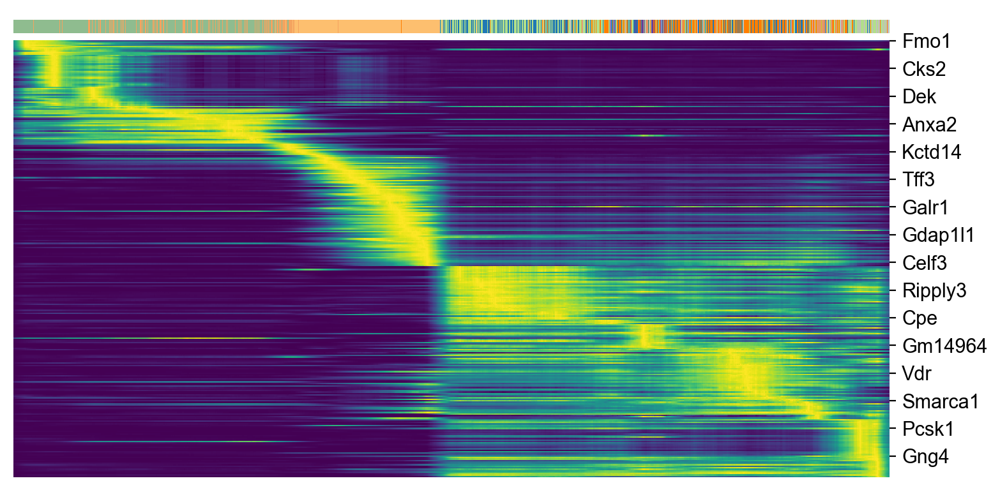

In [29]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', col_color='clusters', n_convolve=100)

## Top-likelihood genes

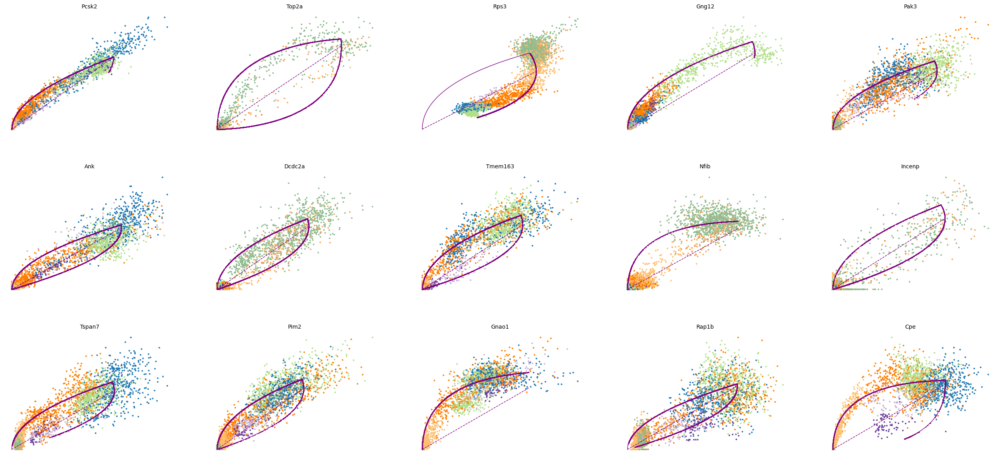

In [7]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata, basis=top_genes[:15], ncols=5, frameon=False)


In [8]:
adataTop = adata[:,top_genes[:5000]]

## Cluster-specific top-likelihood genes

In [31]:
scv.tl.rank_dynamical_genes(adata, groupby='clusters')
df = scv.get_df(adata, 'rank_dynamical_genes/names')
df.head(5)

ranking genes by cluster-specific likelihoods
    finished (0:00:01) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


,Ductal,Ngn3 low EP,Ngn3 high EP,Pre-endocrine,Beta,Alpha,Delta,Epsilon
0,Top2a,Top2a,Gnas,Abcc8,Pcsk2,Cpe,Pcsk2,Pak3
1,Incenp,Dcdc2a,Rbfox3,Tmem163,Ank,Pak3,Pak3,Meis2
2,Dcdc2a,Bicc1,Cbfa2t3,Ank,Pak3,Pim2,Rap1b,Map1b
3,Mki67,Adamts1,Sulf2,Gnao1,Tspan7,Gnao1,Abcc8,Ank
4,Cdk1,Mki67,Btbd17,Tspan7,Map1b,Rap1b,Scgn,Runx1t1


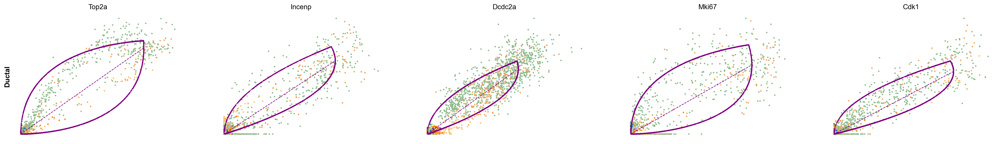

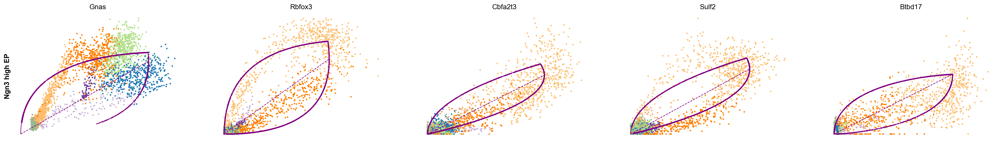

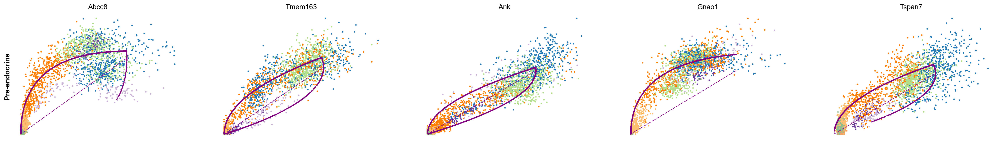

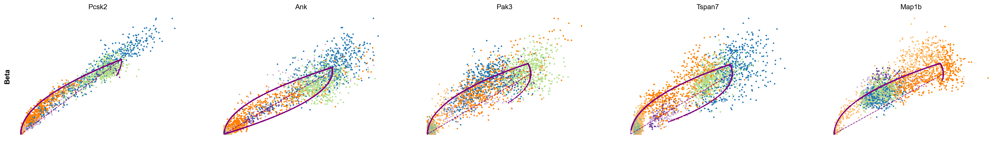

In [32]:
for cluster in ['Ductal', 'Ngn3 high EP', 'Pre-endocrine', 'Beta']:
    scv.pl.scatter(adata, df[cluster][:5], ylabel=cluster, frameon=False)


# Skeleton Methods

In [6]:
import skeleton_methods.skeleton as skel
import numpy as np
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors
from scipy.spatial import distance_matrix
from scipy.stats import gaussian_kde
import collections
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.metrics import adjusted_rand_score
from scipy.spatial import distance_matrix
import igraph

import random
 
random.seed(123)

## Construct knots

In [103]:

def constructKnots(X, centers = None, labels = None, k = None, rep = 100):
    """
      construct knots using overfitting kMeans
  
      Parameters
      ----------
      X : np.array
          the data ndarray
      centers: np.array of the knots, can be provided
      labels: np.array of the knot label that each data point belongs to
      k: the number of knots
      rep: times of random initialization for kMeans
  
      Returns
      -------
      centers: ndarray of the constructed knots
      cluster: array of knot labels to which the data points belong to
      nknots: number of knots
      withinss: within cluster sum of squares for each Voronoi cell corresponding to the knots
    """
    n, d = X.shape
    #construct knots
    if centers is None and labels is None:
        # Overfitting k-means
        #setting the number of knots k
        if k is None:
            k = round(np.sqrt(n))
    
        km = KMeans(n_clusters = k, n_init = rep)
        km.fit(X)
        centers = km.cluster_centers_
        labels = km.labels_
    
    elif labels is None:#centers provided but not labels
        nbrs = NearestNeighbors(n_neighbors=1).fit(centers)
        labels = nbrs.kneighbors(X, return_distance=False)
        labels = np.array([sublist[0] for sublist in labels])
        k = len(centers)
          
    elif centers is None:#labels provided but not centers
        elements_count = collections.Counter(labels)
        k = len(elements_count.items())
        centers = np.array([[0.0 for col in range(d)] for row in range(k)])
        for key, value in elements_count.items():
            centers[key,] = np.mean(X[labels == key,], axis=0)
      
    else:
        k = len(centers)
        
      
    withinss = np.array([0.0]*k)
    for i in range(k):
        withinss[i] = np.sum(np.square(X[labels == i,:]-centers[i,:]))
      
    return {"centers":centers, "cluster":labels, "nknots":k, "withinss": withinss}

In [12]:
conKnots = constructKnots(adataTop.X, k = 100)
skeleton = conKnots
edgeWeights = skel.skelWeights(adataTop.X, conKnots, wedge = ['voronoi'])
skeleton.update(edgeWeights)
X_nn = skeleton["nn"]
knots = skeleton["centers"]
kkdists = distance_matrix(knots,knots)

In [13]:
# Compute the cluster sizes
knotSizes = np.zeros(100)
for i in range(100):
    knotSizes[i]= sum(X_nn[:,0] == i)
sum(knotSizes<5)

49

In [14]:
#filter out small clusters and reconstruct
knots = np.array(knots[knotSizes>=5,:])
conKnots = constructKnots(adataTop.X, centers= knots)
skeleton = conKnots
edgeWeights = skel.skelWeights(adataTop.X, conKnots, wedge = ['voronoi'])
skeleton.update(edgeWeights)

In [15]:
X_nn = skeleton["nn"]
knots = skeleton["centers"]
kkdists = distance_matrix(knots,knots)
knotSizes = np.zeros(len(knots))
for i in range(len(knots)):
    knotSizes[i]= sum(X_nn[:,0] == i)


In [16]:
sum(knotSizes<5)

0

## Compute voron weights

In [131]:
m = knots.shape[0]
voron_weights = np.array([[0.0 for col in range(m)] for row in range(m)])
for i in range(m-1): #loop through knots pairs
    center1 = knots[i]
    wi1 = np.where(X_nn[:,0] == i)[0]
    wi2 = np.where(X_nn[:,1] == i)[0]
    for j in range(i+1,m):
        center2 = knots[j]
        wj1 = np.where(X_nn[:,0] == j)[0]
        wj2 = np.where(X_nn[:,1] == j)[0]
        #data point indices within 2nn neighborhood of knots i, j
        nn2ij = np.union1d(np.intersect1d(wi1, wj2), np.intersect1d(wi2, wj1))
    
        if len(nn2ij) < 1 :#not in Delaunnay Triangulation
            voron_weights[i,j] = 0.0
            continue
    
        # Euclidean distance between two centers
        d12 = kkdists[i,j]

        #compute the Voronoi density 
        voron_weights[i,j] = len(nn2ij)/d12
    

In [19]:
skeleton.update( {"voron_weights": voron_weights + np.transpose((voron_weights))})

In [21]:
np.sum(skeleton["voron_weights"] > 0)

270

## Visualize the centers

In [22]:
adataTop.obsm["X_umap"][:,0]

ArrayView([ 6.143066 , -9.906417 ,  7.559791 , ..., -9.88225  ,
            6.6124244,  3.0710435], dtype=float32)

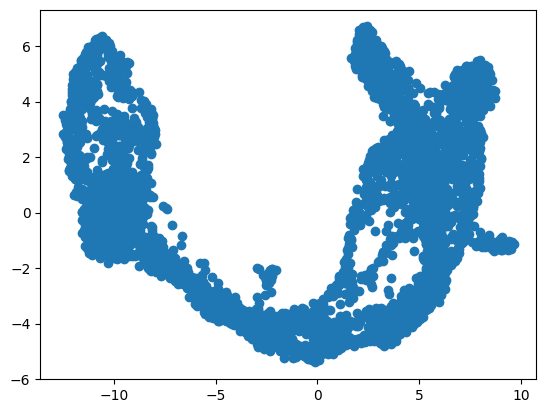

In [23]:
plt.scatter(adataTop.obsm["X_umap"][:,0],adataTop.obsm["X_umap"][:,1])
plt.show()

In [24]:
# closes observation for the knots. Save time for UMAP calculation
nbrs = NearestNeighbors(n_neighbors=1).fit(adataTop.X)
nnx = nbrs.kneighbors(skeleton["centers"], return_distance=False) 

In [25]:
adataTop.X.shape[0]

3696

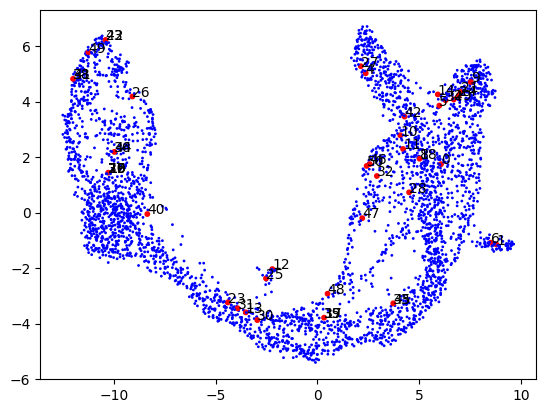

In [26]:
# make knots larger sizes for plotting
sizes = np.array([1]*adataTop.X.shape[0])
sizes[nnx[:,0]] = 10
colors = ['red' if i in nnx[:,0] else 'blue' for i in range(adataTop.X.shape[0])]
fig, ax = plt.subplots()
ax.scatter(adataTop.obsm["X_umap"][:,0],adataTop.obsm["X_umap"][:,1], s=sizes ,c=colors)
for i in range(len(knots)):
    ax.annotate(str(i), (adataTop.obsm["X_umap"][:,0][nnx[i,0]], adataTop.obsm["X_umap"][:,1][nnx[i,0]]))
plt.show()

## segment skeleton

In [27]:
import skeleton_methods.clustering as skelclus

In [28]:
adataTop.obs['clusters']

index
AAACCTGAGAGGGATA    Pre-endocrine
AAACCTGAGCCTTGAT           Ductal
AAACCTGAGGCAATTA            Alpha
AAACCTGCATCATCCC           Ductal
AAACCTGGTAAGTGGC     Ngn3 high EP
                        ...      
TTTGTCAAGTGACATA    Pre-endocrine
TTTGTCAAGTGTGGCA     Ngn3 high EP
TTTGTCAGTTGTTTGG           Ductal
TTTGTCATCGAATGCT            Alpha
TTTGTCATCTGTTTGT          Epsilon
Name: clusters, Length: 3696, dtype: category
Categories (8, object): ['Ductal', 'Ngn3 low EP', 'Ngn3 high EP', 'Pre-endocrine', 'Beta', 'Alpha', 'Delta', 'Epsilon']

In [29]:
knots = skeleton["centers"]
X_knotlabels = skeleton["cluster"]

#similarities
weights = skeleton["voron_weights"]
kcut = 1
hclustKnot = skelclus.cluster_weights(weights, X_knotlabels, kcut = kcut, method='average')


In [30]:
tol = 1e-10
#choose correct cut
cutheight = hclustKnot["hclust"][-kcut][2]
#cut some edges
weights[weights<(np.max(weights)-cutheight+tol)] = 0

#Euclidean distance between centers
kkdists = distance_matrix(knots,knots)
kkdists[weights == 0] = 0

# ###############################################
# # get the graph based on Euclidean similarities
# ###############################################
g = igraph.Graph.Weighted_Adjacency(kkdists.tolist(),  mode='undirected')
skeleton.update({"kkdists": kkdists, "cutWeights": weights, "g" :g}) 



In [70]:
# save the computed skeleton
import pickle

pickle.dump([skeleton], open("skeleton.pkl", "wb"))

## Skeleton Visualization

In [31]:
weights

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.45637003],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.45637003, 0.        ,
        0.        ]])

<Axes: >

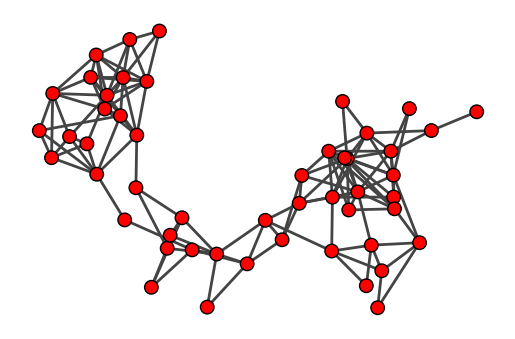

In [32]:
import random
random.seed(1234)
fig, ax = plt.subplots()
layout = g.layout("kk")
igraph.plot(g, layout=layout, target=ax)

In [129]:
# save the layout
pickle.dump([layout], open("layout.pkl", "wb"))

## Add cell clusters as graph attribute

In [7]:
from collections import defaultdict
X_nn = skeleton["nn"]
knots = skeleton["centers"]

knotClusbyCell = defaultdict(lambda: "Not Present")
for i in range(len(knots)):
    df = pd.Series(adataTop.obs['clusters'][X_nn[:,0] == i])
    knotClusbyCell[i] = df.value_counts()

In [19]:
knotClusbyCell[11]

Beta             113
Pre-endocrine     76
Delta              2
Alpha              1
Ductal             0
Ngn3 low EP        0
Ngn3 high EP       0
Epsilon            0
Name: clusters, dtype: int64

In [35]:
majorCellClus = [knotClusbyCell[i].index[0] for i in range(len(knots))]

In [36]:
id_gen = igraph.UniqueIdGenerator()
color_indices = [id_gen.add(value) for value in majorCellClus]
palette = igraph.ClusterColoringPalette(len(id_gen))
colors = [palette[index] for index in color_indices]
g.vs["color"] = colors 

g.vs["label"] = [i for i in range(len(knots))]

<Axes: >

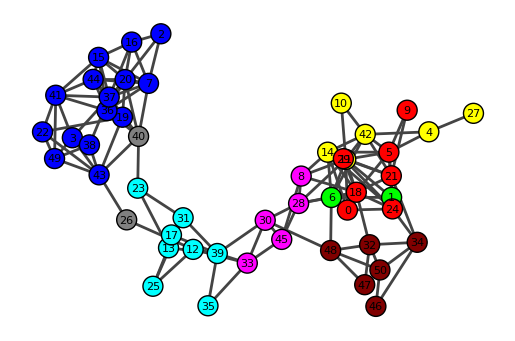

In [37]:
fig, ax = plt.subplots()
igraph.plot(g, layout=layout, target=ax,vertex_size = 0.3, vertex_label_size = 8)

# Refine knots by separating knots with decent amount of other cell types

In [119]:
from collections import defaultdict
X_nn = skeleton["nn"]
knots = skeleton["centers"]

knotClusbyCell = defaultdict(lambda: "Not Present")
for i in range(len(knots)):
    df = pd.Series(adataTop.obs['clusters'][X_nn[:,0] == i])
    knotClusbyCell[i] = df.value_counts()

In [120]:
knots.shape

(51, 5000)

In [41]:
knotClusbyCell[7]

Ductal           162
Ngn3 low EP       52
Ngn3 high EP       0
Pre-endocrine      0
Beta               0
Alpha              0
Delta              0
Epsilon            0
Name: clusters, dtype: int64

In [121]:
refineId = [7,8,11,14,20,40,43]
for id in refineId:
    knots[id,:] = np.mean( adataTop.X[np.logical_and( X_nn[:,0] == id , adataTop.obs['clusters'] == knotClusbyCell[id].index[0]),:], axis= 0)
    knots = np.vstack((knots, 
                       np.mean( adataTop.X[np.logical_and( X_nn[:,0] == id , adataTop.obs['clusters'] != knotClusbyCell[id].index[0]),:], axis= 0)))

In [122]:
conKnots = constructKnots(adataTop.X, centers= np.array(knots))
skeleton_r = conKnots
edgeWeights = skel.skelWeights(adataTop.X, conKnots, wedge = ['voronoi'])
skeleton_r.update(edgeWeights)

In [123]:
X_nn = skeleton_r["nn"]
knots = skeleton_r["centers"]
kkdists = distance_matrix(knots,knots)
knotSizes = np.zeros(len(knots))
for i in range(len(knots)):
    knotSizes[i]= sum(X_nn[:,0] == i)
min(knotSizes)

5.0

In [124]:
# closes observation for the knots. Save time for UMAP calculation
nbrs = NearestNeighbors(n_neighbors=1).fit(adataTop.X)
nnx = nbrs.kneighbors(skeleton_r["centers"], return_distance=False) 

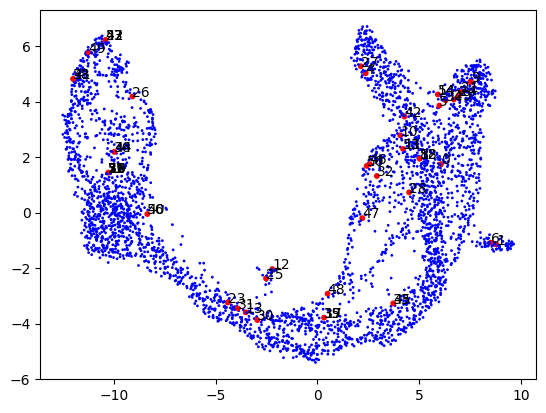

In [125]:
# make knots larger sizes for plotting
sizes = np.array([1]*adataTop.X.shape[0])
sizes[nnx[:,0]] = 10
colors = ['red' if i in nnx[:,0] else 'blue' for i in range(adataTop.X.shape[0])]
fig, ax = plt.subplots()
ax.scatter(adataTop.obsm["X_umap"][:,0],adataTop.obsm["X_umap"][:,1], s=sizes ,c=colors)
for i in range(len(knots)):
    ax.annotate(str(i), (adataTop.obsm["X_umap"][:,0][nnx[i,0]], adataTop.obsm["X_umap"][:,1][nnx[i,0]]))
plt.show()

In [150]:
m = knots.shape[0]
voron_weights = np.array([[0.0 for col in range(m)] for row in range(m)])
for i in range(m-1): #loop through knots pairs
    center1 = knots[i]
    wi1 = np.where(X_nn[:,0] == i)[0]
    wi2 = np.where(X_nn[:,1] == i)[0]
    for j in range(i+1,m):
        center2 = knots[j]
        wj1 = np.where(X_nn[:,0] == j)[0]
        wj2 = np.where(X_nn[:,1] == j)[0]
        #data point indices within 2nn neighborhood of knots i, j
        nn2ij = np.union1d(np.intersect1d(wi1, wj2), np.intersect1d(wi2, wj1))
    
        if len(nn2ij) < 1 :#not in Delaunnay Triangulation
            voron_weights[i,j] = 0.0
            continue
    
        # Euclidean distance between two centers
        d12 = kkdists[i,j]

        #compute the Voronoi density 
        voron_weights[i,j] = len(nn2ij)/d12
    
skeleton_r.update( {"voron_weights": voron_weights + np.transpose((voron_weights))})

In [156]:
# Segment Skeleton
import skeleton_methods.clustering as skelclus
knots = skeleton_r["centers"]
X_knotlabels = skeleton_r["cluster"]

#similarities
weights = skeleton_r["voron_weights"]
kcut = 1
hclustKnot = skelclus.cluster_weights(weights, X_knotlabels, kcut = kcut, method='average')

tol = 1e-10
#choose correct cut
cutheight = hclustKnot["hclust"][-kcut][2]
#cut some edges
weights[weights<(np.max(weights)-cutheight+tol)] = 0

#Euclidean distance between centers
kkdists = distance_matrix(knots,knots)
kkdists[weights == 0] = 0

# ###############################################
# # get the graph based on Euclidean similarities
# ###############################################
g = igraph.Graph.Weighted_Adjacency(kkdists.tolist(),  mode='undirected')
skeleton_r.update({"kkdists": kkdists, "cutWeights": weights, "g" :g}) 




In [158]:
# save the computed skeleton
import pickle

pickle.dump(skeleton_r, open("skeleton_r.pkl", "wb"))

In [198]:
# save the layout
pickle.dump([layout_r], open("layout_r.pkl", "wb"))

In [63]:
import pickle
layout_r = pickle.load(open("layout_r.pkl","rb"))[0]

In [3]:
skeleton_r = pickle.load(open("skeleton_r.pkl","rb"))

In [183]:
from collections import defaultdict
X_nn = skeleton_r["nn"]
knots = skeleton_r["centers"]

knotClusbyCell = defaultdict(lambda: "Not Present")
for i in range(len(knots)):
    df = pd.Series(adataTop.obs['clusters'][X_nn[:,0] == i])
    knotClusbyCell[i] = df.value_counts()

majorCellClus = [knotClusbyCell[i].index[0] for i in range(len(knots))]
id_gen = igraph.UniqueIdGenerator()
color_indices = [id_gen.add(value) for value in majorCellClus]
palette = igraph.ClusterColoringPalette(len(id_gen))
colors = [palette[index] for index in color_indices]
g.vs["color"] = colors 

g.vs["label"] = [i for i in range(len(knots))]


<Axes: >

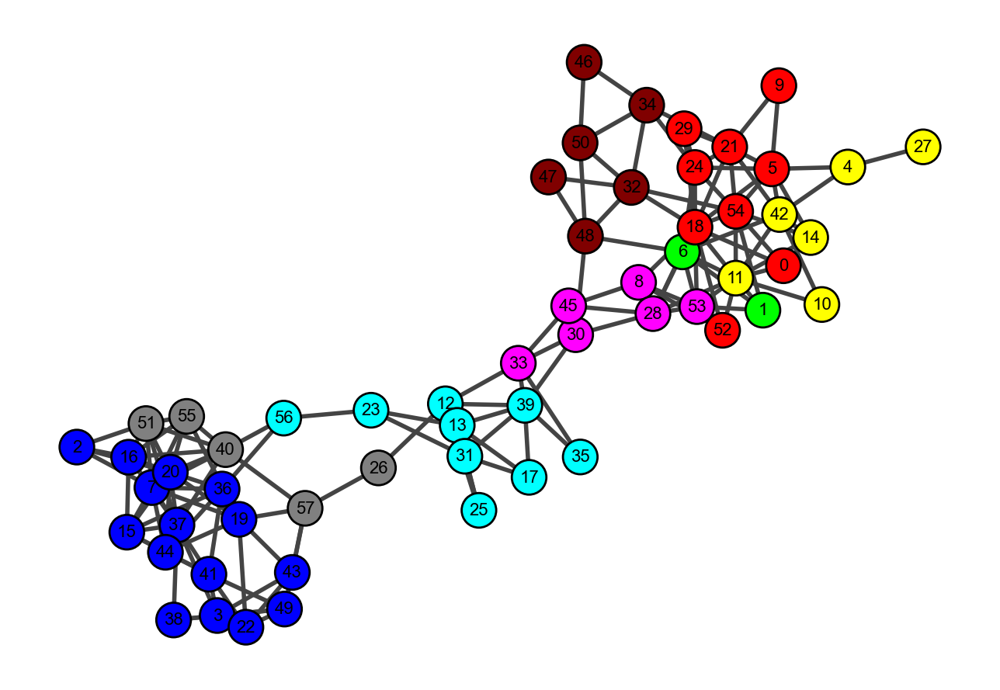

In [200]:
fig, ax = plt.subplots(figsize=(8,6))
igraph.plot(g, layout=layout_r, target=ax,vertex_size = 0.3, vertex_label_size = 8)

# Incorporate gene velocity information

## Compute cell velocity for top genes

In [38]:
scv.tl.recover_dynamics(adataTop, n_jobs =6)
scv.tl.velocity(adataTop, mode='dynamical')
scv.tl.velocity_graph(adataTop)
adataTop.layers["velocity"]

recovering dynamics (using 6/12 cores)


c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\anndata\compat\_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


or disable the progress bar using `show_progress_bar=False`.


c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scvelo\tools\dynamical_model.py:721: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scvelo\tools\dynamical_model.py:724: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (0:06:51) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:10) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/12 cores)


c:\ProgramData\Anaconda3\envs\bioenv\lib\site-packages\scvelo\core\_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:00:33) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


array([[ 1.84190030e+00, -5.01059741e-02, -1.63242079e-01, ...,
                    nan,             nan,             nan],
       [ 8.06362855e-04,  5.17083093e-01,  1.68042435e-01, ...,
                    nan,             nan,             nan],
       [ 1.43493811e+00, -1.49764848e-02, -1.55377995e-01, ...,
                    nan,             nan,             nan],
       ...,
       [ 8.94471125e-03, -1.32939860e-01,  1.88830551e-01, ...,
                    nan,             nan,             nan],
       [ 4.42743923e-01,  6.51537223e-02, -1.50710026e-01, ...,
                    nan,             nan,             nan],
       [ 1.11151023e+00, -2.91356463e-02, -1.57056281e-01, ...,
                    nan,             nan,             nan]])

## Saving results

In [69]:
adataTop.write('data/pancreasTop5000.h5ad', compression='gzip')


In [2]:
import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np
import pandas as pd
import anndata as ad

import matplotlib.pyplot as plt

import skeleton_methods.skeleton as skel
import numpy as np
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors
from scipy.spatial import distance_matrix
from scipy.stats import gaussian_kde
import collections
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.metrics import adjusted_rand_score
from scipy.spatial import distance_matrix
import igraph

import random
 
random.seed(123)

adataTop = scv.read('data/pancreasTop5000.h5ad')


KeyboardInterrupt: 

In [169]:
import pickle
skeleton = pickle.load(open("skeleton.pkl","rb"))[0]
layout = pickle.load(open("layout.pkl","rb"))


## Use velocity data

In [81]:
adata = scv.read('data/pancreas.h5ad')
velocity_graph = adata.uns["velocity_graph"]

In [41]:
# velocity not symmetric
(abs(velocity_graph-velocity_graph.T)>1e-10).nnz

722040

In [207]:
idxSet = defaultdict(lambda: "Not Present")
for i in range(len(knots)):
    idxSet[i] = skeleton_r["cluster"] == i

In [208]:
knot_velocity_graph = np.array([[0.0 for _ in  range(len(knots))] for _ in range(len(knots))])
for i in range(len(knots)):
    for j in range(len(knots)):
        mat = velocity_graph[idxSet[i]][:, idxSet[j]]
        if mat.count_nonzero() == 0:
            knot_velocity_graph[i,j] = 0
        else:
            knot_velocity_graph[i,j] = mat.sum() / mat.count_nonzero()

In [60]:
knot_velocity_graph

array([[0.27412864, 0.27078378, 0.        , ..., 0.        , 0.        ,
        0.37688618],
       [0.30040002, 0.25650024, 0.        , ..., 0.        , 0.        ,
        0.16878575],
       [0.        , 0.        , 0.05471911, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.23382641, 0.        ,
        0.38331687],
       [0.        , 0.        , 0.        , ..., 0.        , 0.15474103,
        0.        ],
       [0.47053373, 0.        , 0.        , ..., 0.19567944, 0.        ,
        0.36630004]])

## Graph edges based on velocity

### Direct from summarizing velocity graph

In [61]:
velog0 = igraph.Graph.Weighted_Adjacency(knot_velocity_graph.tolist(),  mode='directed')

<Axes: >

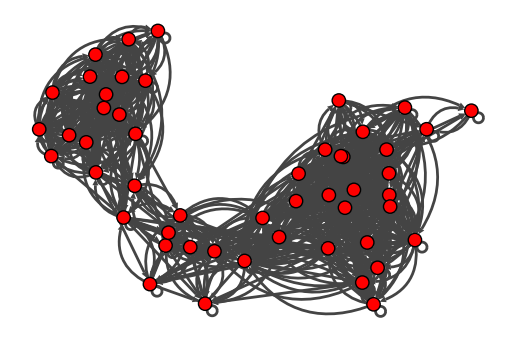

In [62]:
fig, ax = plt.subplots()
igraph.plot(velog0, layout=layout, target=ax)

### Simplify velocity graph with Voron weights

<Axes: >

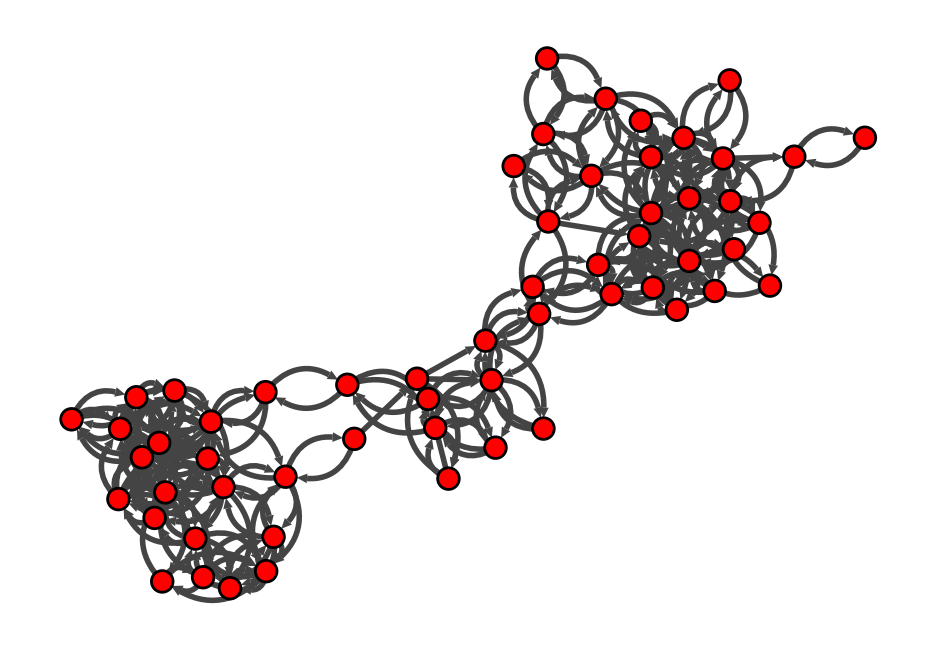

In [210]:
# remove some edges according to the constructed skeleton
velocity_skeleton = knot_velocity_graph
velocity_skeleton[skeleton_r["voron_weights"]==0]=0
velog = igraph.Graph.Weighted_Adjacency(velocity_skeleton.tolist(),  mode='directed') 
fig, ax = plt.subplots()
igraph.plot(velog, layout=layout_r, target=ax)

In [211]:
id_gen = igraph.UniqueIdGenerator()
color_indices = [id_gen.add(value) for value in majorCellClus]
palette = igraph.ClusterColoringPalette(len(id_gen))
colors = [palette[index] for index in color_indices]
velog.vs["color"] = colors 

velog.vs["label"] = [i for i in range(len(knots))]


In [212]:
edgeWeightCat = (np.round(np.array(velog.es["weight"])*3)).astype(int)
palette = igraph.ClusterColoringPalette(len(edgeWeightCat))
edgecolors = [palette[index] for index in edgeWeightCat]
velog.es["color"] = edgecolors 

velog.es['width'] = np.sqrt(edgeWeightCat)*2 + 1

print("source is ", velog.es[0].source)
print("target is ", velog.es[0].target)
print("color index is", edgeWeightCat[0])

source is  0
target is  11
color index is 1


In [213]:
print("source is ", velog.es[8].source)
print("target is ", velog.es[8].target)
print("color index is", edgeWeightCat[8])

source is  2
target is  16
color index is 0


<Axes: >

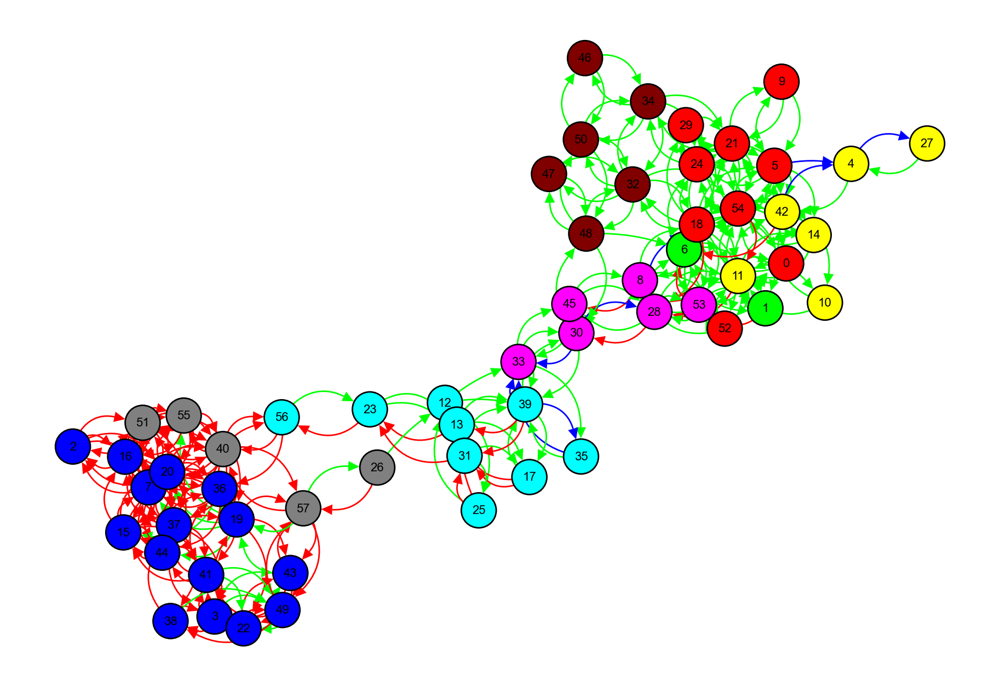

In [215]:

fig, ax = plt.subplots(figsize=(12,8))
igraph.plot(velog, layout=layout_r, target=ax, autocurve = True,edge_curved="0.1", edge_width = 1,vertex_size = 0.3, vertex_label_size = 8)

### Only leaving one direction

In [216]:
np.median(knot_velocity_graph[knot_velocity_graph > 0])

0.2075972315362305

In [222]:
knot_velocity_graph1 = knot_velocity_graph
for i in range(len(knots)):
    for j in range(i+1,len(knots)):
        if knot_velocity_graph1[i,j] < knot_velocity_graph1[j,i]:
            if knot_velocity_graph1[i,j] < 0.3:
                knot_velocity_graph1[i,j] = 0.0
        else:
            if knot_velocity_graph1[j,i] < 0.3:
                knot_velocity_graph1[j,i] = 0.0

<Axes: >

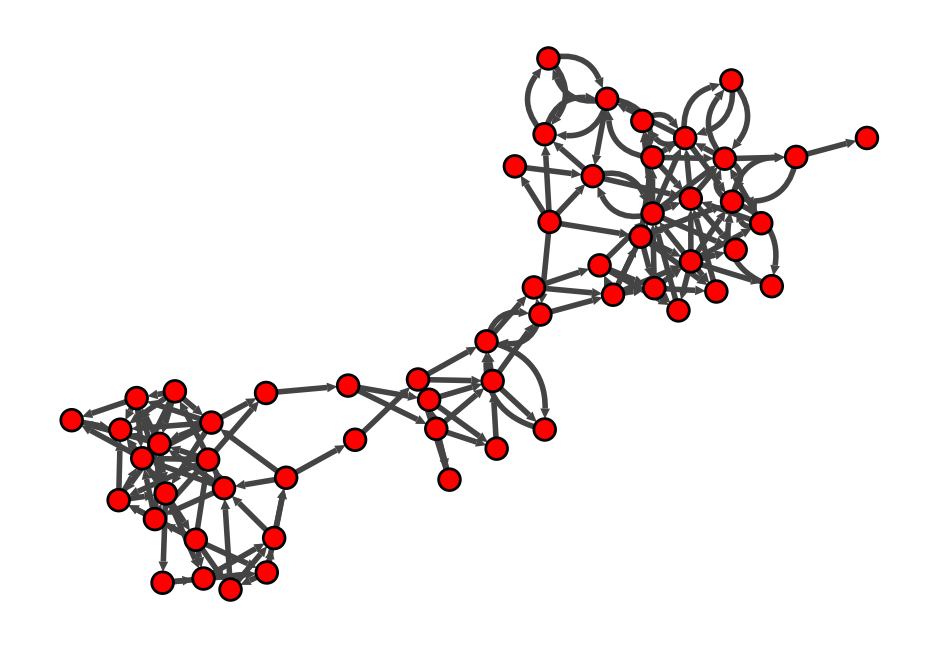

In [223]:
velog_1e = igraph.Graph.Weighted_Adjacency(knot_velocity_graph1.tolist(),  mode='directed') 
fig, ax = plt.subplots()
igraph.plot(velog_1e, layout=layout_r, target=ax)

In [224]:
id_gen = igraph.UniqueIdGenerator()
vcolor_indices = [id_gen.add(value) for value in majorCellClus]
palette = igraph.ClusterColoringPalette(len(id_gen))
vcolors = [palette[index] for index in color_indices]
velog_1e.vs["color"] = vcolors 

velog_1e.vs["label"] = [i for i in range(len(knots))]


In [225]:
edgeWeightCat = (np.round(np.array(velog_1e.es["weight"])*3)).astype(int)
palette = igraph.ClusterColoringPalette(len(edgeWeightCat))
edgecolors = [palette[index] for index in edgeWeightCat]
velog_1e.es["color"] = edgecolors 

velog_1e.es['width'] = np.sqrt(edgeWeightCat)*2 + 1


In [114]:
velog_1e.es["weight"]

[0.24263119767900765,
 0.23774713277816772,
 0.2346118894116632,
 0.20004717953555234,
 0.05482622241297512,
 0.2275162788286601,
 0.17414928880008734,
 0.5866685049241874,
 0.45334548950195314,
 0.5366692819902974,
 0.32648894810440515,
 0.23670428027228455,
 0.2932106593869767,
 0.3019220662234452,
 0.26272066901711855,
 0.31166476364573376,
 0.25794755130480035,
 0.2826561779709336,
 0.36209946158547074,
 0.31155773445411966,
 0.3727127766359974,
 0.055296296165103,
 0.06076547735044976,
 0.05792515898404056,
 0.37015165441176473,
 0.4861706034342448,
 0.445726414031318,
 0.2726110097524282,
 0.30789344787597656,
 0.3014491941870713,
 0.24032629860772026,
 0.4681266265389807,
 0.44777110792835306,
 0.2970590729644333,
 0.3979155819719009,
 0.2844585057475936,
 0.4233765411376953,
 0.46255356854466595,
 0.3543595622356673,
 0.2220142200165774,
 0.46964240796638257,
 0.4812118636483106,
 0.16924440408054786,
 0.352676102810267,
 0.4379166688616824,
 0.24478175874390354,
 0.27055121818

<Axes: >

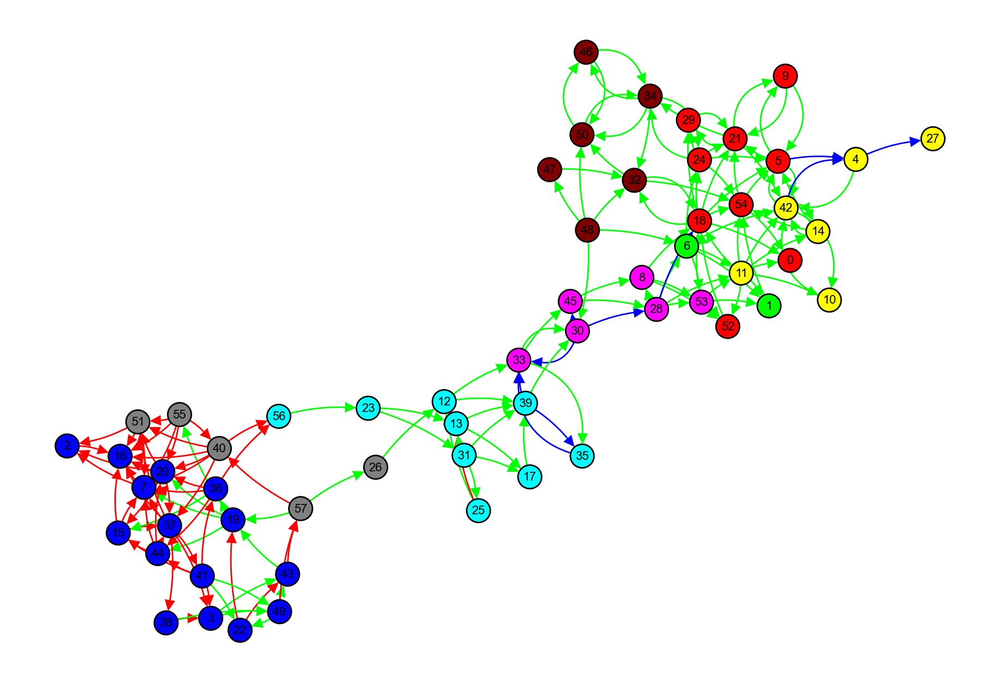

In [226]:
fig, ax = plt.subplots(figsize=(12,8))
igraph.plot(velog_1e, layout=layout_r, target=ax, autocurve = True,edge_curved="0.1", edge_width = 1,vertex_size = 0.2, vertex_label_size = 8)

In [227]:
 edgeWeightCat

array([1, 0, 1, 1, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0,
       0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 2, 1, 1, 2, 2, 2, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 2, 1, 1,
       1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0])

In [228]:

print("source is ", velog_1e.es[4].source)
print("target is ", velog_1e.es[4].target)
print("color index is", edgeWeightCat[4])

source is  4
target is  27
color index is 2


In [229]:
print("source is ", velog_1e.es[0].source)
print("target is ", velog_1e.es[0].target)
print("color index is", edgeWeightCat[0])

source is  1
target is  54
color index is 1


In [103]:
velocity = adataTop.layers["velocity"]

In [107]:
velocity.shape

(3696, 5000)

In [106]:
sum(np.isnan(velocity)[0])

2711

# Skeleton constructed according to cell types

## construct knots

In [21]:
cellClusters = adataTop.obs.clusters
cellClusterCats = np.unique(cellClusters)

In [87]:
subdata = adataTop.X[cellClusters == cellClusterCats[0],:]
conKnots0 = constructKnots(subdata, k = int(np.round(np.sqrt(subdata.shape[0])*1.5)))


In [88]:
centers = conKnots0["centers"]


In [89]:
for i in range(1,len(cellClusterCats)):
    subdata = adataTop.X[cellClusters == cellClusterCats[i],:]
    conKnots0 = constructKnots(subdata, k = int(np.round(np.sqrt(subdata.shape[0])*1.5)))
    centers = np.vstack((centers,conKnots0["centers"]))
centers.shape

(243, 5000)

In [90]:
conKnots = constructKnots(adataTop.X, centers= centers)
skeleton = conKnots
edgeWeights = skel.skelWeights(adataTop.X, conKnots, wedge = ['voronoi'])
skeleton.update(edgeWeights)

In [91]:
# Compute the cluster sizes
X_nn = skeleton["nn"]
knots = skeleton["centers"]
knotSizes = np.zeros(len(knots))
for i in range(100):
    knotSizes[i]= sum(X_nn[:,0] == i)
sum(knotSizes<5)

208

In [93]:
#filter out small clusters and reconstruct
knots = np.array(knots[knotSizes>=5,:])
conKnots = constructKnots(adataTop.X, centers= knots)
skeleton = conKnots
edgeWeights = skel.skelWeights(adataTop.X, conKnots, wedge = ['voronoi'])
skeleton.update(edgeWeights)

In [94]:
X_nn = skeleton["nn"]
knots = skeleton["centers"]
kkdists = distance_matrix(knots,knots)
knotSizes = np.zeros(len(knots))
for i in range(len(knots)):
    knotSizes[i]= sum(X_nn[:,0] == i)


In [96]:
knots.shape

(35, 5000)

## visualize the knots

In [78]:
# closes observation for the knots. Save time for UMAP calculation
nbrs = NearestNeighbors(n_neighbors=1).fit(adataTop.X)
nnx = nbrs.kneighbors(skeleton["centers"], return_distance=False) 

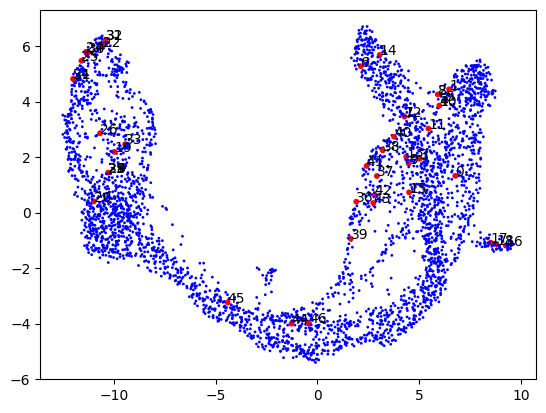

In [79]:
# make knots larger sizes for plotting
sizes = np.array([1]*adataTop.X.shape[0])
sizes[nnx[:,0]] = 10
colors = ['red' if i in nnx[:,0] else 'blue' for i in range(adataTop.X.shape[0])]
fig, ax = plt.subplots()
ax.scatter(adataTop.obsm["X_umap"][:,0],adataTop.obsm["X_umap"][:,1], s=sizes ,c=colors)
for i in range(len(knots)):
    ax.annotate(str(i), (adataTop.obsm["X_umap"][:,0][nnx[i,0]], adataTop.obsm["X_umap"][:,1][nnx[i,0]]))
plt.show()

Not performing well, so not pursuing the cell-type-wise knots construction approach any further.

# Directly using gene velocity for graph visualization

In [4]:
velocity = adataTop.layers["velocity"]

In [5]:
hasvelo = np.logical_not( np.isnan(velocity[0]) )

In [6]:
velocity = velocity[:,hasvelo]

In [7]:
adataTop_v = adataTop[:,hasvelo]

In [8]:
np.sum(np.isnan(velocity))

0

In [11]:
knots = skeleton_r["centers"]
from collections import defaultdict
idxSet = defaultdict(lambda: "Not Present")
for i in range(len(knots)):
    idxSet[i] = skeleton_r["cluster"] == i

In [12]:
knot_velocity = np.array([[0.0 for _ in  range(velocity.shape[1])] for _ in range(len(knots))])
for i in range(len(knots)):
    knot_velocity[i,:] = np.mean(velocity[idxSet[i],:], axis = 0)

In [13]:
knot_velocity

array([[ 1.64269064e+00, -3.00098443e-02, -1.56309022e-01, ...,
         3.72961956e-04,  2.19422684e-08,  0.00000000e+00],
       [ 9.22008700e-01,  4.80422871e-02, -1.61431120e-01, ...,
         2.44519082e-05,  4.40452350e-09,  0.00000000e+00],
       [ 1.10169056e-03,  1.06394673e-02,  1.67815438e-01, ...,
         8.12231361e-03,  7.12174085e-09,  0.00000000e+00],
       ...,
       [ 4.42018433e-04, -8.19277233e-03,  1.72728879e-01, ...,
         1.79296551e-03,  8.58973079e-10,  0.00000000e+00],
       [ 3.59857722e-05,  1.07250422e-02,  1.73635468e-01, ...,
         6.12770241e-03,  9.07424824e-11,  0.00000000e+00],
       [ 6.38038551e-03, -6.22530261e-02,  1.15053596e-01, ...,
         1.06359930e-08,  0.00000000e+00,  0.00000000e+00]])

In [14]:
voron_weights = skeleton_r["voron_weights"]

## only have edges between nearby knots, and use projected velocity for edge weights

In [58]:
from numpy.linalg import norm
knot_velocity_graph = np.array([[0.0 for _ in  range(len(knots))] for _ in range(len(knots))])
for i in range(len(knots)):
    for j in range(len(knots)):
        if i != j and voron_weights[i,j] > 0:
            xdiff = (adataTop_v.X[j,:]-  adataTop_v.X[i,:]).toarray()[0]
            knot_velocity_graph[i,j] = np.dot(knot_velocity[i,:], xdiff)/norm(xdiff)

In [59]:
knot_velocity_graph[:10,:10]

array([[ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        , -0.4168825 ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        , -0.96690863,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.19299096,  0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        , -0.44088156,
         0.        ,  0.        ,  0.        ,  0.        , -0.08409151],
       [ 0.        ,  0.3801326 ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        

In [22]:
# # to reverse the arrows for negative directions
# knot_velocity_graph1 = np.array([[0.0 for _ in  range(len(knots))] for _ in range(len(knots))])
# for i in range(len(knots)):
#     for j in range(i,len(knots)):
#         if knot_velocity_graph[i,j] == 0 and knot_velocity_graph[j,i] == 0:
#             continue
#         elif knot_velocity_graph[i,j] < 0 and knot_velocity_graph[j,i] < 0:
#             knot_velocity_graph1[j,i] = abs(knot_velocity_graph[i,j])
#             knot_velocity_graph1[i,j] = abs(knot_velocity_graph[j,i])
#         elif knot_velocity_graph[i,j] < 0:
#             knot_velocity_graph1[j,i] = max(abs(knot_velocity_graph[i,j]), knot_velocity_graph[j,i])
#         elif knot_velocity_graph[j,i] < 0:
#             knot_velocity_graph1[i,j] = max(abs(knot_velocity_graph[j,i]), knot_velocity_graph[i,j])
#         else:
#             knot_velocity_graph1[j,i] = knot_velocity_graph[j,i]
#             knot_velocity_graph1[i,j] = knot_velocity_graph[i,j]


In [60]:
# to reverse the arrows for negative directions
knot_velocity_graph1 = np.array([[0.0 for _ in  range(len(knots))] for _ in range(len(knots))])
for i in range(len(knots)):
    for j in range(len(knots)):
        if knot_velocity_graph[i,j] > 0:
             knot_velocity_graph1[i,j] = knot_velocity_graph[i,j]


In [51]:
np.quantile(abs(knot_velocity_graph[knot_velocity_graph!=0]), [0,0.25,.5,0.75,1])

array([3.52826598e-04, 2.69568116e-01, 5.44417442e-01, 1.13495286e+00,
       1.33560161e+01])

<Axes: >

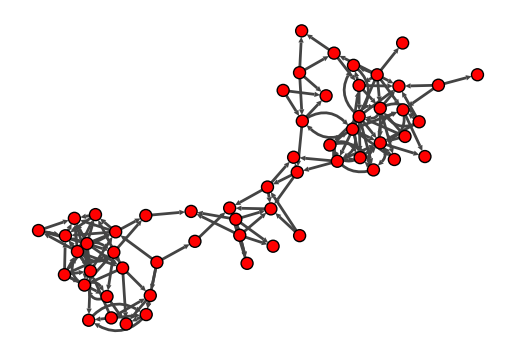

In [64]:
velog_r = igraph.Graph.Weighted_Adjacency(knot_velocity_graph1.tolist(),  mode='directed') 
fig, ax = plt.subplots()
igraph.plot(velog_r, layout=layout_r, target=ax)

In [65]:
from collections import defaultdict
X_nn = skeleton_r["nn"]
knots = skeleton_r["centers"]

knotClusbyCell = defaultdict(lambda: "Not Present")
for i in range(len(knots)):
    df = pd.Series(adataTop.obs['clusters'][X_nn[:,0] == i])
    knotClusbyCell[i] = df.value_counts()

majorCellClus = [knotClusbyCell[i].index[0] for i in range(len(knots))]

In [66]:
id_gen = igraph.UniqueIdGenerator()
vcolor_indices = [id_gen.add(value) for value in majorCellClus]
palette = igraph.ClusterColoringPalette(len(id_gen))
vcolors = [palette[index] for index in vcolor_indices]
velog_r.vs["color"] = vcolors 

velog_r.vs["label"] = [i for i in range(len(knots))]


In [41]:
pd.Series(velog_r.es["weight"]).describe()

count    186.000000
mean       0.086197
std        0.073104
min        0.000102
25%        0.027668
50%        0.060778
75%        0.131651
max        0.299236
dtype: float64

In [42]:
np.sum(knot_velocity_graph < 0)

160

In [67]:
bins = np.quantile(np.array(velog_r.es["weight"]), [0,0.25, 0.5, 0.75,1])
bins[0] = bins[0] -1
bins[-1] = bins[-1] +1
edgeWeightCat = pd.cut(pd.Series(velog_r.es["weight"]), bins)

In [44]:
edgeWeightCat

0      (0.0608, 0.132]
1      (0.0608, 0.132]
2      (0.0608, 0.132]
3       (-1.0, 0.0277]
4       (-1.0, 0.0277]
            ...       
181     (-1.0, 0.0277]
182     (0.132, 1.299]
183    (0.0608, 0.132]
184    (0.0608, 0.132]
185     (0.132, 1.299]
Length: 186, dtype: category
Categories (4, interval[float64, right]): [(-1.0, 0.0277] < (0.0277, 0.0608] < (0.0608, 0.132] < (0.132, 1.299]]

In [45]:
edgeWeightCatcode = edgeWeightCat.cat.codes
edgeWeightCatcode

0      2
1      2
2      2
3      0
4      0
      ..
181    0
182    3
183    2
184    2
185    3
Length: 186, dtype: int8

In [46]:
np.unique(edgeWeightCatcode)

array([0, 1, 2, 3], dtype=int8)

In [68]:
palette = list(igraph.ClusterColoringPalette(len(np.unique(edgeWeightCatcode))))
palette[3] = (0.0, 0.0, 0.0, 1.0)
edgecolors = [palette[index] for index in edgeWeightCatcode]
velog_r.es["color"] = edgecolors 

velog_r.es['width'] = edgeWeightCatcode*2 + 1


<Axes: >

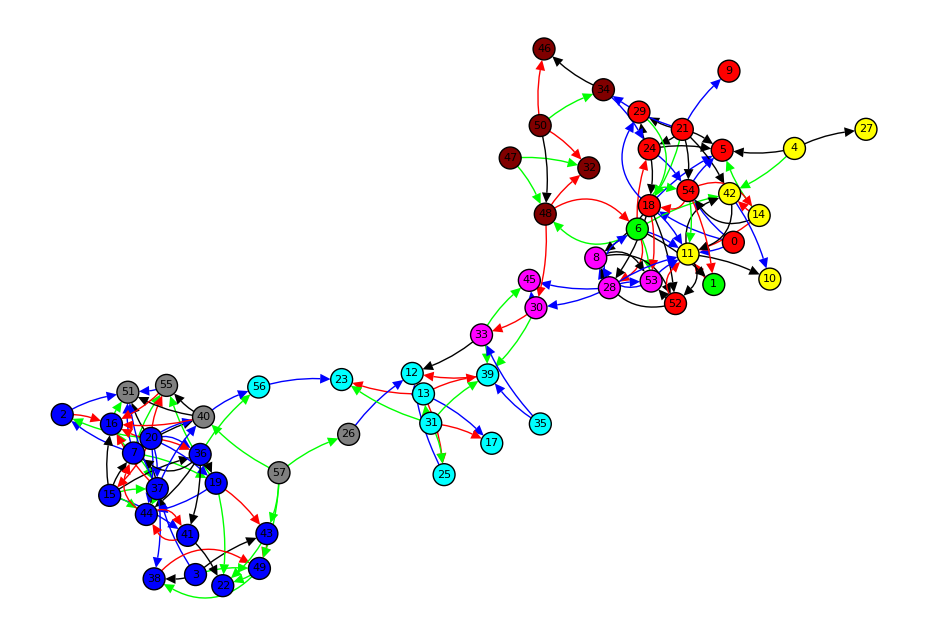

In [69]:
fig, ax = plt.subplots(figsize=(12,8))
igraph.plot(velog_r, layout=layout_r, target=ax, autocurve = True,edge_curved="0.1", edge_width = 1,vertex_size = 0.2, vertex_label_size = 8)

red is for edge cat 0, green is for edge cat 1,  blue is for category 2, black is for category 3

In [356]:
print("source is ", velog_r.es[0].source)
print("target is ", velog_r.es[0].target)
print("color index is", edgeWeightCatcode[0])

source is  0
target is  11
color index is 1


In [360]:
print("source is ", velog_r.es[98].source)
print("target is ", velog_r.es[98].target)
print("color index is", edgeWeightCatcode[98])

source is  20
target is  37
color index is 0


## only have edges between nearby knots, and use cosine similarity for edge weights

In [70]:
from numpy.linalg import norm
knot_velocity_graph = np.array([[0.0 for _ in  range(len(knots))] for _ in range(len(knots))])
for i in range(len(knots)):
    for j in range(len(knots)):
        if i != j and voron_weights[i,j] > 0:
            xdiff = (adataTop_v.X[j,:]-  adataTop_v.X[i,:]).toarray()[0]
            knot_velocity_graph[i,j] = np.dot(knot_velocity[i,:], xdiff)/(norm(xdiff) * norm(knot_velocity[i,:]))

In [18]:
# # to reverse the arrows for negative directions
# knot_velocity_graph1 = np.array([[0.0 for _ in  range(len(knots))] for _ in range(len(knots))])
# for i in range(len(knots)):
#     for j in range(i,len(knots)):
#         if knot_velocity_graph[i,j] == 0 and knot_velocity_graph[j,i] == 0:
#             continue
#         elif knot_velocity_graph[i,j] < 0 and knot_velocity_graph[j,i] < 0:
#             knot_velocity_graph1[j,i] = abs(knot_velocity_graph[i,j])
#             knot_velocity_graph1[i,j] = abs(knot_velocity_graph[j,i])
#         elif knot_velocity_graph[i,j] < 0:
#             knot_velocity_graph1[j,i] = max(abs(knot_velocity_graph[i,j]), knot_velocity_graph[j,i])
#         elif knot_velocity_graph[j,i] < 0:
#             knot_velocity_graph1[i,j] = max(abs(knot_velocity_graph[j,i]), knot_velocity_graph[i,j])
#         else:
#             knot_velocity_graph1[j,i] = knot_velocity_graph[j,i]
#             knot_velocity_graph1[i,j] = knot_velocity_graph[i,j]


In [71]:
# to reverse the arrows for negative directions
knot_velocity_graph1 = np.array([[0.0 for _ in  range(len(knots))] for _ in range(len(knots))])
for i in range(len(knots)):
    for j in range(len(knots)):
        if knot_velocity_graph[i,j] > 0:
             knot_velocity_graph1[i,j] = knot_velocity_graph[i,j]


In [19]:
np.quantile(abs(knot_velocity_graph[knot_velocity_graph!=0]), [0,0.25,.5,0.75,1])

array([4.81833025e-05, 2.73322087e-02, 5.46832170e-02, 1.28872983e-01,
       2.99235744e-01])

In [72]:
from collections import defaultdict
X_nn = skeleton_r["nn"]
knots = skeleton_r["centers"]

knotClusbyCell = defaultdict(lambda: "Not Present")
for i in range(len(knots)):
    df = pd.Series(adataTop.obs['clusters'][X_nn[:,0] == i])
    knotClusbyCell[i] = df.value_counts()

majorCellClus = [knotClusbyCell[i].index[0] for i in range(len(knots))]

In [73]:
id_gen = igraph.UniqueIdGenerator()
vcolor_indices = [id_gen.add(value) for value in majorCellClus]
palette = igraph.ClusterColoringPalette(len(id_gen))
vcolors = [palette[index] for index in vcolor_indices]
velog_r.vs["color"] = vcolors 

velog_r.vs["label"] = [i for i in range(len(knots))]


In [24]:
pd.Series(velog_r.es["weight"]).describe()

count    186.000000
mean       0.086197
std        0.073104
min        0.000102
25%        0.027668
50%        0.060778
75%        0.131651
max        0.299236
dtype: float64

In [25]:
np.sum(knot_velocity_graph < 0)

160

In [74]:
bins = np.quantile(np.array(velog_r.es["weight"]), [0,0.25, 0.5, 0.75,1])
bins[0] = bins[0] -1
bins[-1] = bins[-1] +1
edgeWeightCat = pd.cut(pd.Series(velog_r.es["weight"]), bins)

In [27]:
edgeWeightCat

0      (0.0608, 0.132]
1      (0.0608, 0.132]
2      (0.0608, 0.132]
3       (-1.0, 0.0277]
4       (-1.0, 0.0277]
            ...       
181     (-1.0, 0.0277]
182     (0.132, 1.299]
183    (0.0608, 0.132]
184    (0.0608, 0.132]
185     (0.132, 1.299]
Length: 186, dtype: category
Categories (4, interval[float64, right]): [(-1.0, 0.0277] < (0.0277, 0.0608] < (0.0608, 0.132] < (0.132, 1.299]]

In [75]:
edgeWeightCatcode = edgeWeightCat.cat.codes
edgeWeightCatcode

0      2
1      2
2      2
3      0
4      2
      ..
155    1
156    3
157    3
158    2
159    3
Length: 160, dtype: int8

In [76]:
np.unique(edgeWeightCatcode)

array([0, 1, 2, 3], dtype=int8)

In [77]:
palette = list(igraph.ClusterColoringPalette(len(np.unique(edgeWeightCatcode))))
palette[3] = (0.0, 0.0, 0.0, 1.0)
edgecolors = [palette[index] for index in edgeWeightCatcode]
velog_r.es["color"] = edgecolors 

velog_r.es['width'] = edgeWeightCatcode*2 + 1


<Axes: >

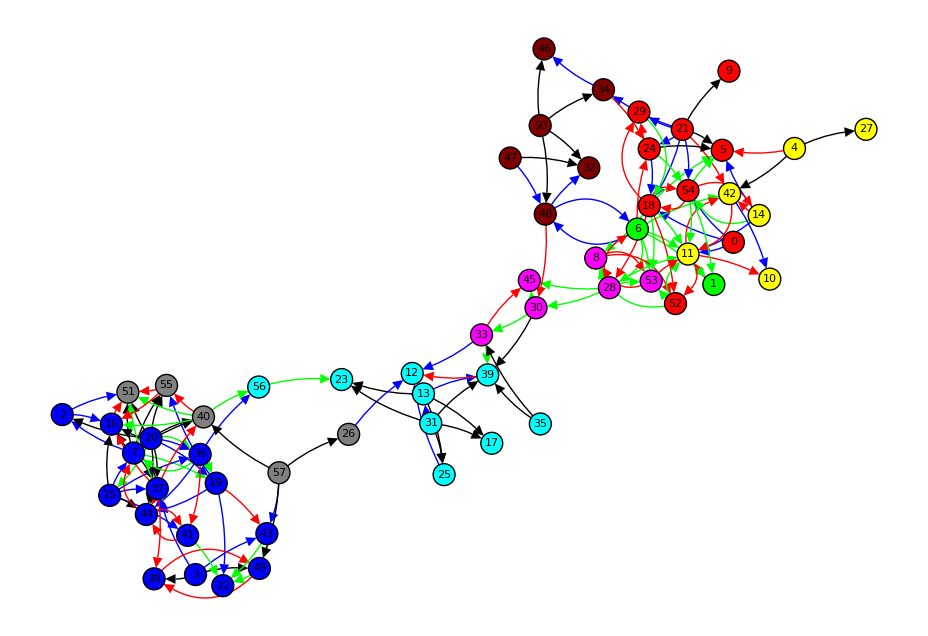

In [78]:
fig, ax = plt.subplots(figsize=(12,8))
igraph.plot(velog_r, layout=layout_r, target=ax, autocurve = True,edge_curved="0.1", edge_width = 1,vertex_size = 0.2, vertex_label_size = 8)

## Having more edges between nn knots

In [41]:
# closes observation for the knots. Save time for UMAP calculation
nbrs = NearestNeighbors(n_neighbors=10).fit(skeleton_r["centers"])
nnk = nbrs.kneighbors(skeleton_r["centers"], return_distance=False) 

In [42]:
knot_velocity_graph = np.array([[0.0 for _ in  range(len(knots))] for _ in range(len(knots))])
for i in range(len(knots)):
    for j in nnk[i][1:]:
        xdiff = (adataTop_v.X[j,:]-  adataTop_v.X[i,:]).toarray()[0]
        knot_velocity_graph[i,j] = np.dot(knot_velocity[i,:], xdiff)/norm(xdiff)

In [520]:
knot_velocity_graph[0]

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       1.01067805, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.99716767, 0.        , 0.        , 0.78264795,
       0.        , 0.        , 0.        , 0.62304199, 0.        ,
       0.        , 0.19884961, 0.        , 0.        , 0.41821863,
       0.        , 0.        , 0.        , 0.        , 0.81469633,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 1.06054821, 0.64300697,
       0.        , 0.        , 0.        ])

In [52]:
# to reverse the arrows for negative directions
knot_velocity_graph1 = np.array([[0.0 for _ in  range(len(knots))] for _ in range(len(knots))])
for i in range(len(knots)):
    for j in range(i,len(knots)):
        if knot_velocity_graph[i,j] == 0 and knot_velocity_graph[j,i] == 0:
            continue
        elif knot_velocity_graph[i,j] < 0 and knot_velocity_graph[j,i] < 0:
            knot_velocity_graph1[j,i] = abs(knot_velocity_graph[i,j])
            knot_velocity_graph1[i,j] = abs(knot_velocity_graph[j,i])
        elif knot_velocity_graph[i,j] < 0:
            knot_velocity_graph1[j,i] = max(abs(knot_velocity_graph[i,j]), knot_velocity_graph[j,i])
        elif knot_velocity_graph[j,i] < 0:
            knot_velocity_graph1[i,j] = max(abs(knot_velocity_graph[j,i]), knot_velocity_graph[i,j])
        else:
            knot_velocity_graph1[j,i] = knot_velocity_graph[j,i]
            knot_velocity_graph1[i,j] = knot_velocity_graph[i,j]

<Axes: >

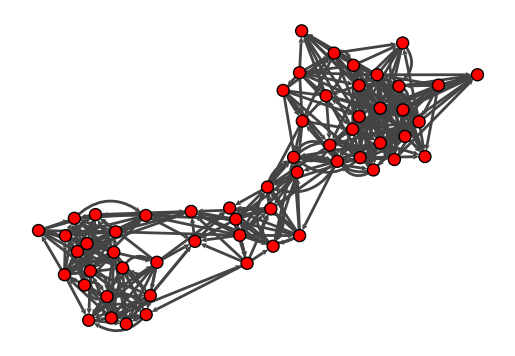

In [44]:
velog_rnn = igraph.Graph.Weighted_Adjacency(knot_velocity_graph1.tolist(),  mode='directed') 
fig, ax = plt.subplots()
igraph.plot(velog_rnn, layout=layout_r, target=ax)

In [46]:
np.quantile(velog_rnn.es["weight"], 0.75)

1.2168119722273938

In [53]:
# Simplify to main 1-directional
knot_velocity_graph1 = knot_velocity_graph
for i in range(len(knots)):
    for j in range(i+1,len(knots)):
        if knot_velocity_graph1[i,j] < knot_velocity_graph1[j,i]:
            if knot_velocity_graph1[i,j] < 1:
                knot_velocity_graph1[i,j] = 0.0
        else:
            if knot_velocity_graph1[j,i] < 1:
                knot_velocity_graph1[j,i] = 0.0

<Axes: >

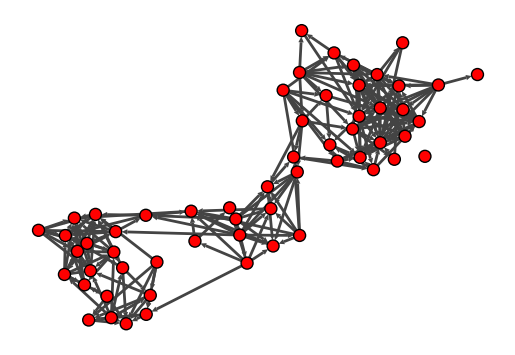

In [54]:
velog_rnn1 = igraph.Graph.Weighted_Adjacency(knot_velocity_graph1.tolist(),  mode='directed') 
fig, ax = plt.subplots()
igraph.plot(velog_rnn1, layout=layout_r, target=ax)

In [56]:
id_gen = igraph.UniqueIdGenerator()
vcolor_indices = [id_gen.add(value) for value in majorCellClus]
palette = igraph.ClusterColoringPalette(len(id_gen))
vcolors = [palette[index] for index in vcolor_indices]
velog_rnn1.vs["color"] = vcolors 

velog_rnn1.vs["label"] = [i for i in range(len(knots))]